## Importing the relevant libraries

In [53]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold, RepeatedKFold
from sklearn.linear_model import LogisticRegression, SGDClassifier, PassiveAggressiveClassifier, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, HistGradientBoostingClassifier, BaggingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.preprocessing import StandardScaler, LabelEncoder
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
# from sklearn.metrics import accuracy_score, plot_roc_curve, plot_precision_recall_curve
from sklearn import metrics
import joblib, scipy

## Loading the dataset

In [54]:
df = pd.read_csv('churn.csv')
df.head()

,Unnamed: 0,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,preferred_offer_types,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,0,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,Gift Vouchers/Coupons,...,300.63,53005.25,17.0,781.75,Yes,Yes,No,Not Applicable,Products always in Stock,0
1,1,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,Gift Vouchers/Coupons,...,306.34,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,0
2,2,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,Gift Vouchers/Coupons,...,516.16,21027.00,22.0,500.69,No,Yes,Yes,Solved in Follow-up,Poor Website,1
3,3,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,Gift Vouchers/Coupons,...,53.27,25239.56,6.0,567.66,No,Yes,Yes,Unsolved,Poor Website,1
4,4,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,Credit/Debit Card Offers,...,113.13,24483.66,16.0,663.06,No,Yes,Yes,Solved,Poor Website,1


## Data Exploration 

In [55]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [56]:
df.shape

(36992, 23)

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36992 entries, 0 to 36991
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   age                           36992 non-null  int64  
 1   gender                        36992 non-null  object 
 2   security_no                   36992 non-null  object 
 3   region_category               31564 non-null  object 
 4   membership_category           36992 non-null  object 
 5   joining_date                  36992 non-null  object 
 6   joined_through_referral       36992 non-null  object 
 7   referral_id                   36992 non-null  object 
 8   preferred_offer_types         36704 non-null  object 
 9   medium_of_operation           36992 non-null  object 
 10  internet_option               36992 non-null  object 
 11  last_visit_time               36992 non-null  object 
 12  days_since_last_login         36992 non-null  int64  
 13  a

In [58]:
df.describe()

,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn_risk_score
count,36992.000000,36992.000000,36992.000000,36992.000000,33549.000000,36992.000000
mean,37.118161,-41.915576,243.472334,29271.194003,686.882199,0.540982
std,15.867412,228.819900,398.289149,19444.806226,194.063624,0.498324
min,10.000000,-999.000000,-2814.109110,800.460000,-760.661236,0.000000
25%,23.000000,8.000000,60.102500,14177.540000,616.150000,0.000000
50%,37.000000,12.000000,161.765000,27554.485000,697.620000,1.000000
75%,51.000000,16.000000,356.515000,40855.110000,763.950000,1.000000
max,64.000000,26.000000,3235.578521,99914.050000,2069.069761,1.000000


In [59]:
df.isnull().sum() / len(df) * 100

age                              0.000000
gender                           0.000000
security_no                      0.000000
region_category                 14.673443
membership_category              0.000000
joining_date                     0.000000
joined_through_referral          0.000000
referral_id                      0.000000
preferred_offer_types            0.778547
medium_of_operation              0.000000
internet_option                  0.000000
last_visit_time                  0.000000
days_since_last_login            0.000000
avg_time_spent                   0.000000
avg_transaction_value            0.000000
avg_frequency_login_days         0.000000
points_in_wallet                 9.307418
used_special_discount            0.000000
offer_application_preference     0.000000
past_complaint                   0.000000
complaint_status                 0.000000
feedback                         0.000000
churn_risk_score                 0.000000
dtype: float64

In [60]:
df[df.duplicated()]

,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,preferred_offer_types,medium_of_operation,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score


## Feature Engineering

## Imputation of missing values

In [61]:
df.preferred_offer_types.fillna(df.preferred_offer_types.mode()[0],inplace=True)

In [62]:
df.points_in_wallet.fillna(df.points_in_wallet.mean(),inplace=True)

In [63]:
df.region_category.fillna(df.region_category.mode()[0],inplace=True)

In [64]:
df.isnull().sum()

age                             0
gender                          0
security_no                     0
region_category                 0
membership_category             0
joining_date                    0
joined_through_referral         0
referral_id                     0
preferred_offer_types           0
medium_of_operation             0
internet_option                 0
last_visit_time                 0
days_since_last_login           0
avg_time_spent                  0
avg_transaction_value           0
avg_frequency_login_days        0
points_in_wallet                0
used_special_discount           0
offer_application_preference    0
past_complaint                  0
complaint_status                0
feedback                        0
churn_risk_score                0
dtype: int64

## Outlier Treatment

age
Skewness: -0.0073193192673247955
Kurtosis: -1.1987327113107535


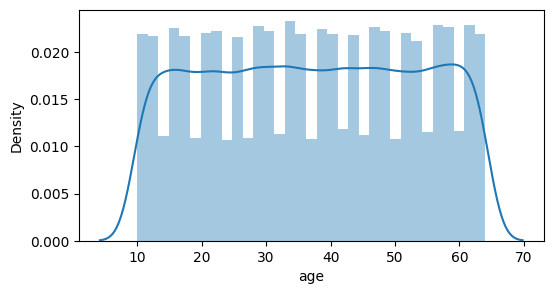

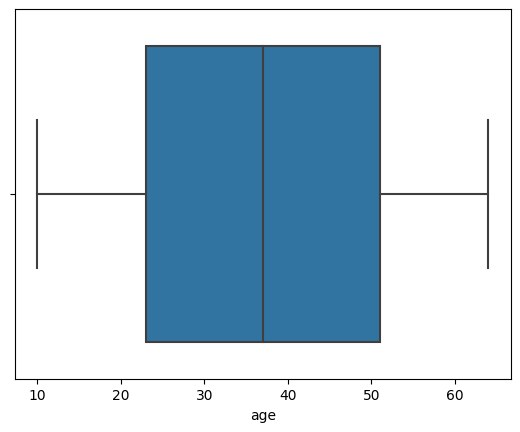

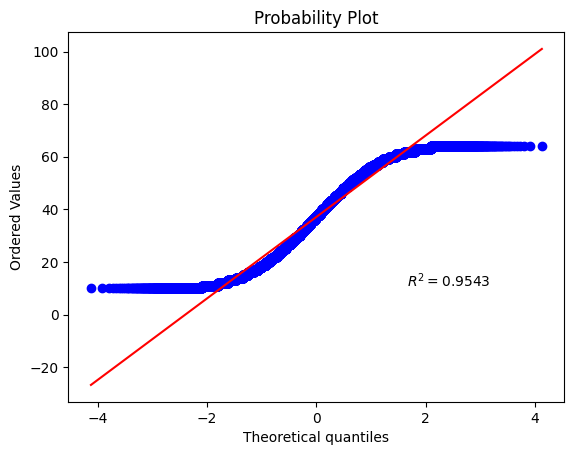

days_since_last_login
Skewness: -3.941355821757813
Kurtosis: 13.545985341506187


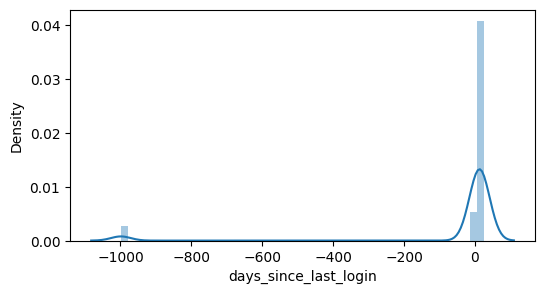

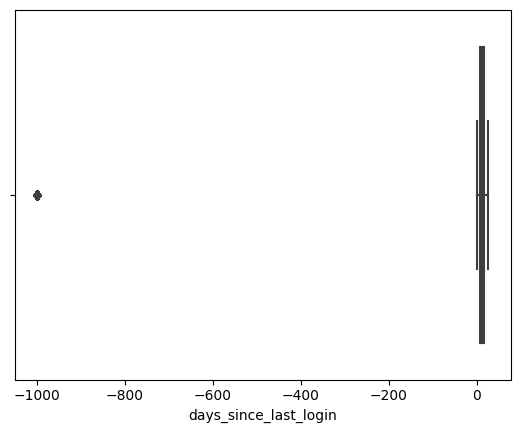

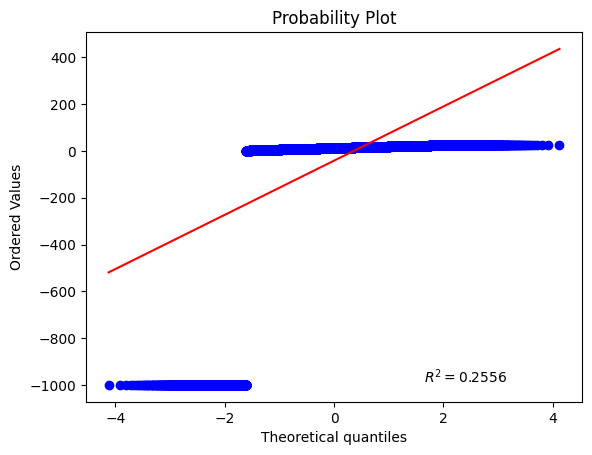

avg_time_spent
Skewness: 0.5396240190653155
Kurtosis: 5.003915280760328


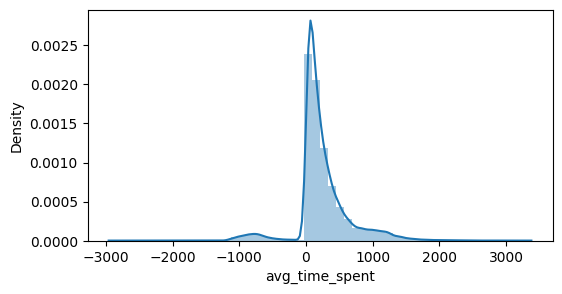

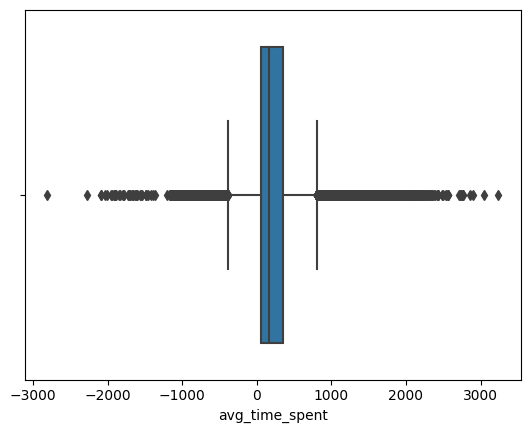

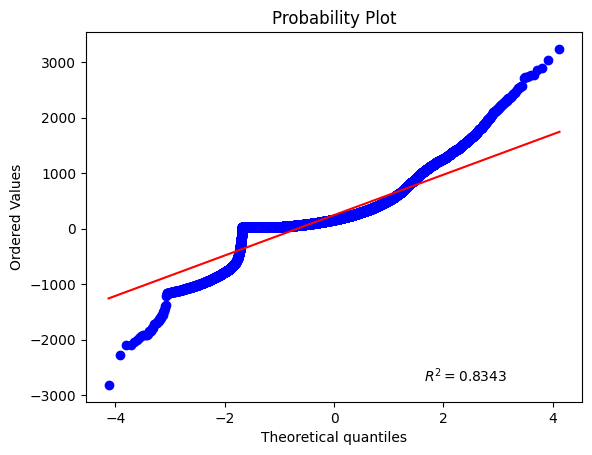

avg_transaction_value
Skewness: 1.0110271627457477
Kurtosis: 1.428287011596547


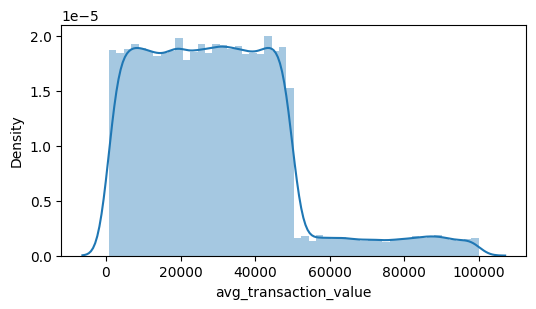

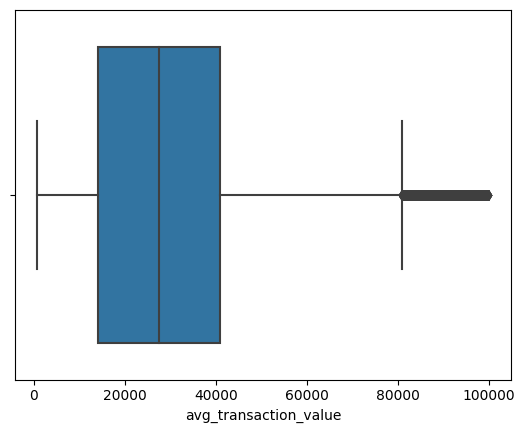

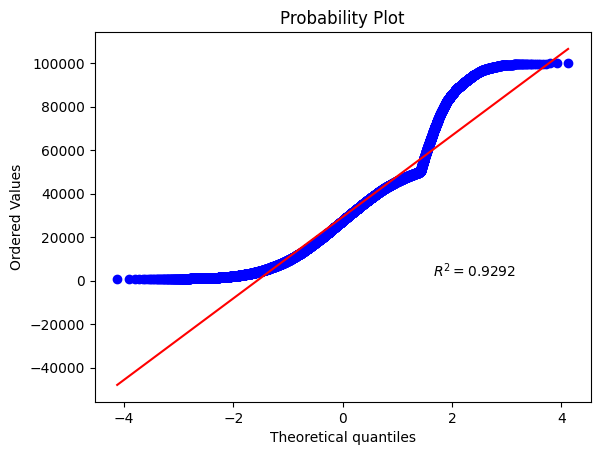

points_in_wallet
Skewness: -0.08432910996827583
Kurtosis: 5.187655737792314


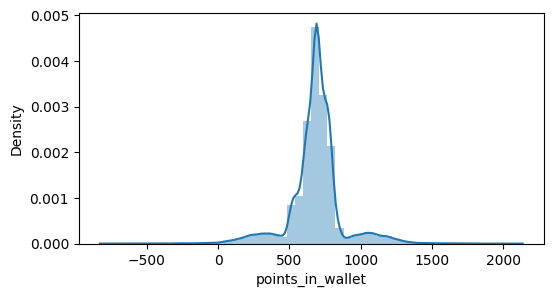

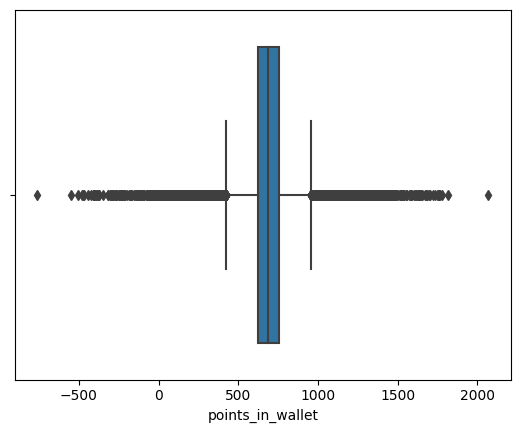

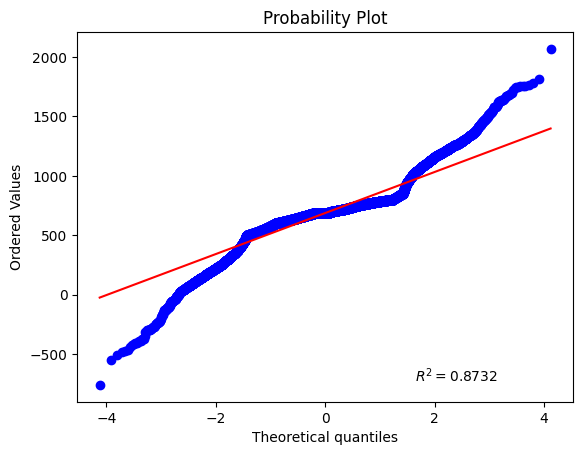

In [65]:
for col in df.columns:
    if col not in ['churn_risk_score']:
        if df[col].dtypes != 'object':
            print(col)
            print("Skewness:",df[col].skew())
            print("Kurtosis:",df[col].kurt())
            plt.figure(figsize=(6,3))
            sns.distplot(df[col])
            plt.show()
            sns.boxplot(x=col,data=df)
            plt.show()
            scipy.stats.probplot(df[col],rvalue=True,plot=plt)
            plt.show()

In [66]:
outlier_columns = ['days_since_last_login','avg_time_spent','avg_transaction_value','points_in_wallet']
for col in outlier_columns:
    lower_limit, upper_limit = df[col].quantile([0.25,0.75])
    IQR = upper_limit - lower_limit
    lower_whisker = lower_limit - 1.5 * IQR
    upper_whisker = upper_limit + 1.5 * IQR
    df[col] = np.where(df[col]<lower_whisker,lower_whisker,np.where(df[col]>upper_whisker,upper_whisker,df[col]))

## Feature Extraction

In [67]:
df['joining_date'] = pd.to_datetime(df['joining_date'])

In [68]:
df['joining_day'] = df['joining_date'].dt.day
df['joining_year'] = df['joining_date'].dt.year
df['joining_month'] = df['joining_date'].dt.month
df['joining_day_of_week'] = df['joining_date'].dt.dayofweek
df['is_joining_day_weekend'] = np.where(df['joining_date'].isin([5,6]),1,0)

In [69]:
df['last_visit_time'] = pd.to_datetime(df['last_visit_time'])

In [70]:
df['last_visit_hour'] = df['last_visit_time'].dt.hour
df['last_visit_min'] = df['last_visit_time'].dt.minute
df['last_visit_second'] = df['last_visit_time'].dt.second

In [71]:
df.drop(['joining_date','last_visit_time','security_no','referral_id'],axis=1,inplace=True)

## Feature Exploration

<Axes: xlabel='churn_risk_score', ylabel='count'>

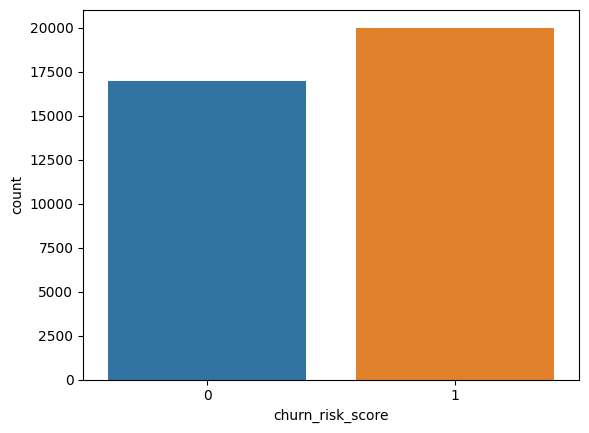

In [72]:
sns.countplot(data=df,x='churn_risk_score')

The classes of the target label seem to be pretty balanced so there is no risk of imbalanced classification.

In [73]:
# sns.pairplot(df,hue='churn_risk_score')

In [74]:
def plot_pie_chart(data):
    values = data.value_counts().values
    labels = data.value_counts().keys()
    plt.figure(figsize=(8,6),dpi=100)
    plt.pie(values,labels=labels,shadow=True,autopct='%1.2f%%')
    plt.show();

gender :


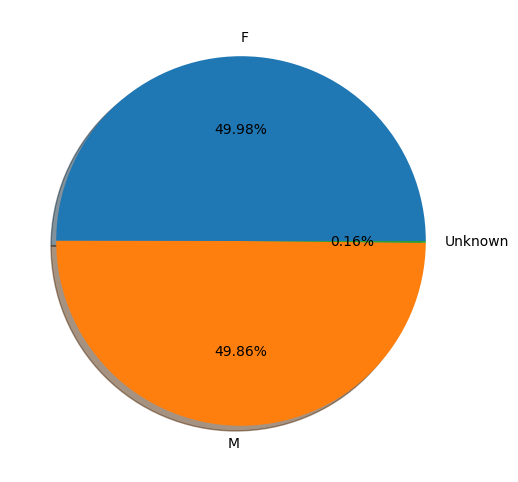

region_category :


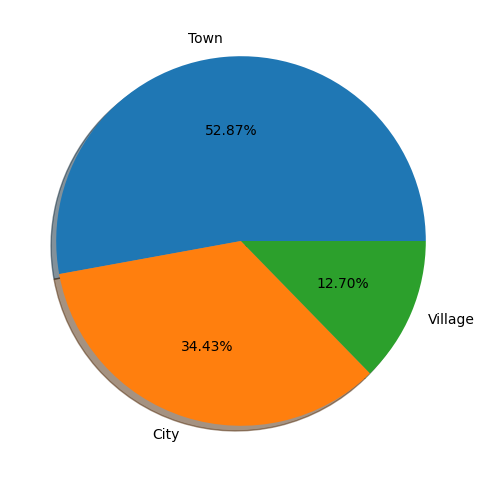

membership_category :


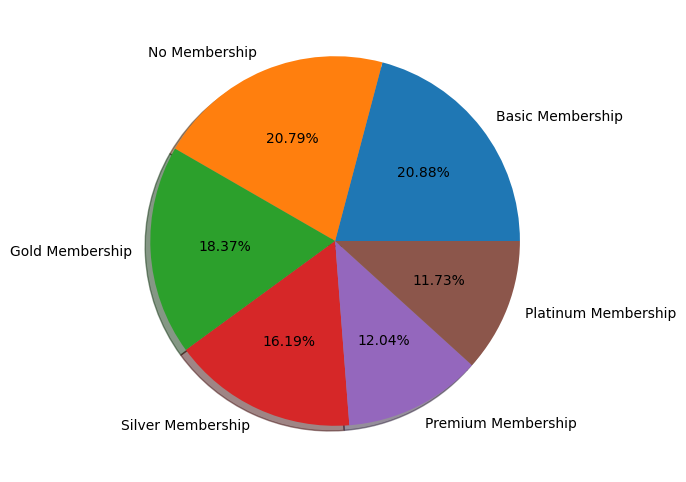

joined_through_referral :


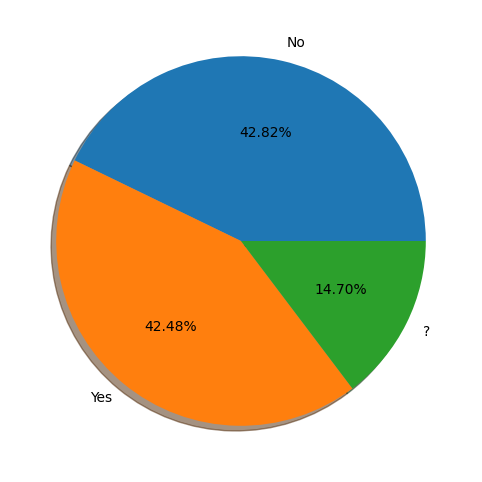

preferred_offer_types :


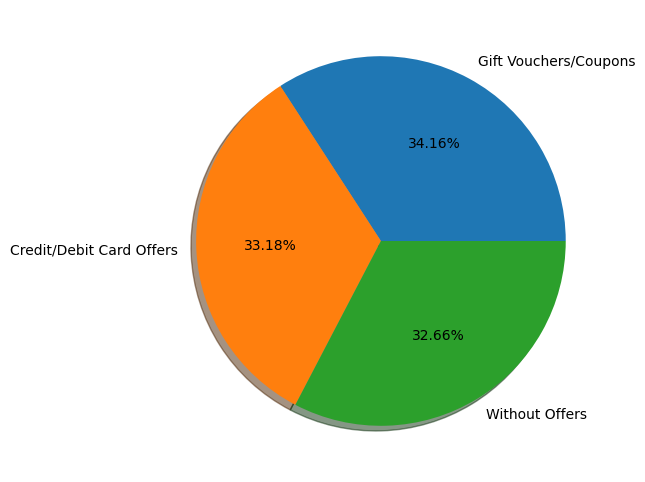

medium_of_operation :


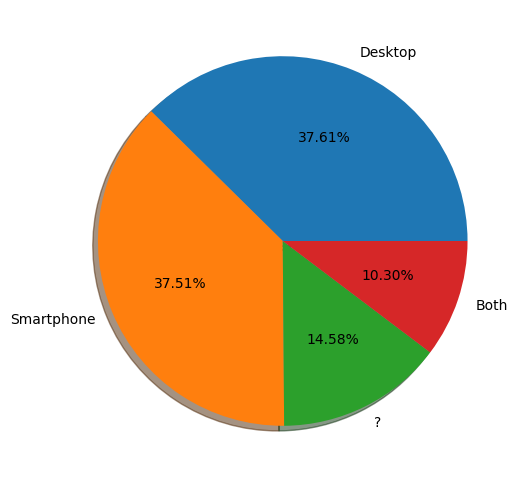

internet_option :


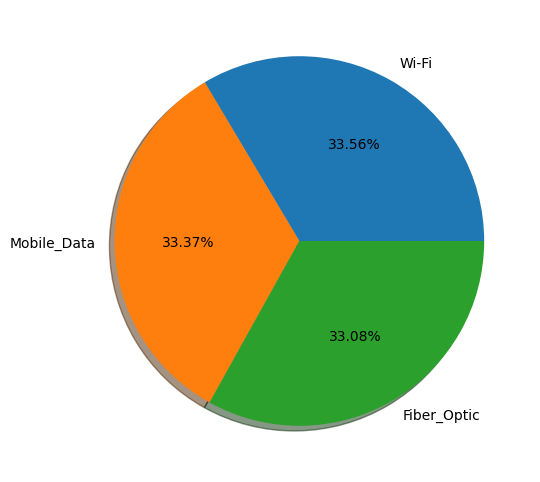

used_special_discount :


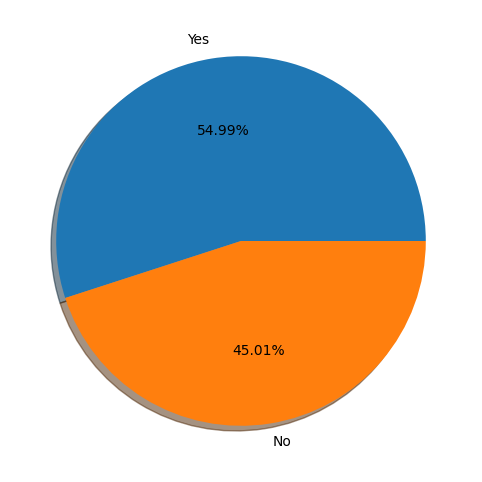

offer_application_preference :


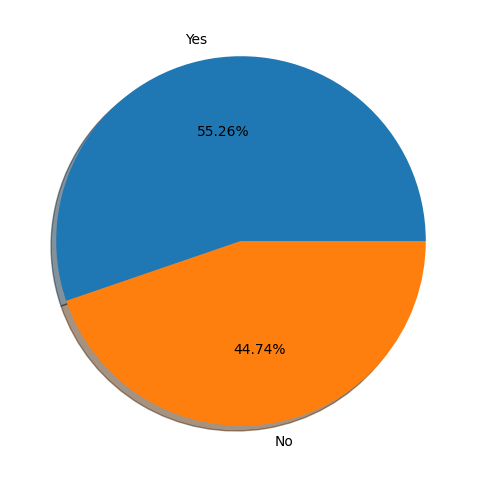

past_complaint :


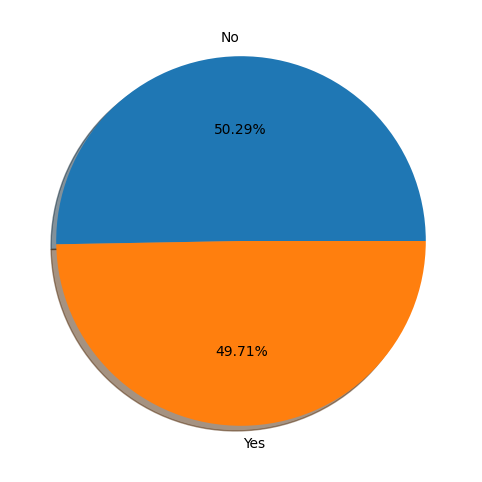

complaint_status :


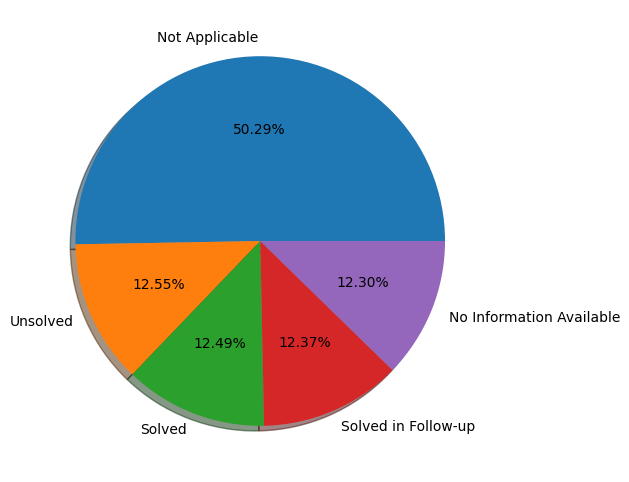

feedback :


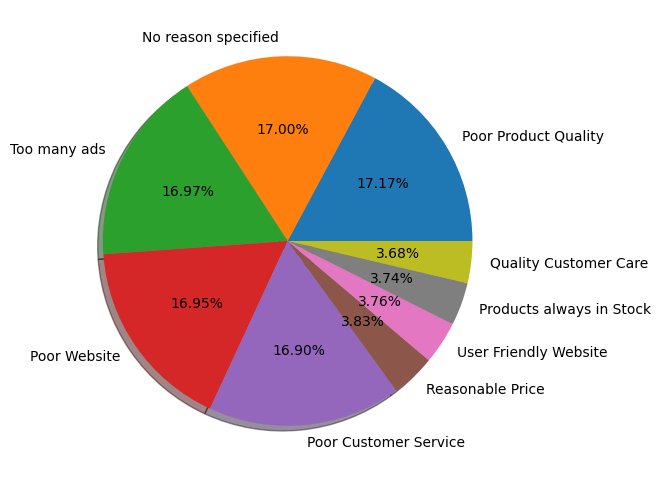

In [75]:
for col in df.columns:
    if col not in ['avg_frequency_login_days']:
        if df[col].dtypes == 'object':
            print(col,':')
            plot_pie_chart(df[col])

## Categorical Encoding

In [76]:
df.gender.replace(['F','M','Unknown'],[0,1,-1],inplace=True)
df.gender = df.gender.astype(int)

In [77]:
df.select_dtypes(object).columns

Index(['region_category', 'membership_category', 'joined_through_referral',
       'preferred_offer_types', 'medium_of_operation', 'internet_option',
       'avg_frequency_login_days', 'used_special_discount',
       'offer_application_preference', 'past_complaint', 'complaint_status',
       'feedback'],
      dtype='object')

In [78]:
df.joined_through_referral.replace(['No','Yes','?'],[0,1,-1],inplace=True)
df.joined_through_referral = df.joined_through_referral.astype(int)

In [79]:
df.medium_of_operation.replace('?','Unknown',inplace=True)

In [80]:
df = df[df['avg_time_spent']>0]
df = df[df['days_since_last_login']>0]

In [81]:
avg_login_freq_days = df.avg_frequency_login_days.value_counts()[1:].keys()
avg_login_freq_days

Index(['13.0', '14.0', '17.0', '8.0', '6.0', '19.0', '10.0', '12.0', '15.0',
       '16.0',
       ...
       '35.73926205967174', '39.20630869831612', '48.186739651407734',
       '39.16663275475858', '31.666436523698707', '35.5643232811194',
       '5.517470005708095', '-12.642470963698166', '37.00181137510583',
       '27.8399274405269'],
      dtype='object', name='avg_frequency_login_days', length=1482)

In [82]:
avg_login_freq_days = avg_login_freq_days.str.replace('-','')

In [83]:
avg_login_freq_days = [float(x) for x in avg_login_freq_days]
imp_val = np.mean(avg_login_freq_days)
df.avg_frequency_login_days.replace('Error',imp_val,inplace=True)
df.avg_frequency_login_days = df.avg_frequency_login_days.str.replace('-','')
df.avg_frequency_login_days = df.avg_frequency_login_days.astype(np.float64)

In [84]:
df.complaint_status.replace(['Solved','Solved in Follow-up'],'Solved',inplace=True)
df.complaint_status.replace(['Not Applicable','No Information Available'],'Unknown',inplace=True)
df.complaint_status.replace(['Unknown','Solved','Unsolved'],[-1,1,0],inplace=True)
df.complaint_status = df.complaint_status.astype(int)

In [85]:
df.feedback.replace(['Poor Product Quality','Too many ads','Poor Website','Poor Customer Service'],-1,inplace=True)
df.feedback.replace(['Reasonable Price','User Friendly Website','Products always in Stock','Quality Customer Care'],1,inplace=True)
df.feedback.replace('No reason specified',0,inplace=True)
df.feedback = df.feedback.astype(int)

In [86]:
df.offer_application_preference.replace(['Yes','No'],[1,0],inplace=True)
df.offer_application_preference = df.offer_application_preference.astype(int)
df.past_complaint.replace(['Yes','No'],[1,0],inplace=True)
df.past_complaint = df.past_complaint.astype(int)
df.joined_through_referral.replace(['Yes','No'],[1,0],inplace=True)
df.joined_through_referral = df.joined_through_referral.astype(int)
df.used_special_discount.replace(['Yes','No'],[1,0],inplace=True)
df.used_special_discount = df.used_special_discount.astype(int)

In [87]:
df.drop('is_joining_day_weekend',axis=1,inplace=True)

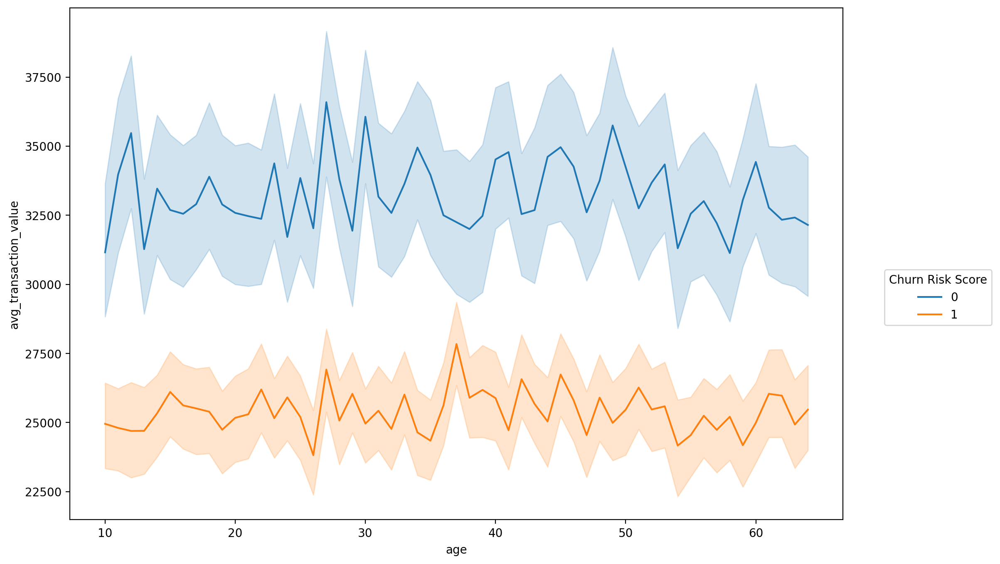

In [88]:
plt.figure(figsize=(12,8),dpi=200)
sns.lineplot(x='age',y='avg_transaction_value',data=df,hue='churn_risk_score')
plt.legend(bbox_to_anchor=(1.2,0.5),title="Churn Risk Score")

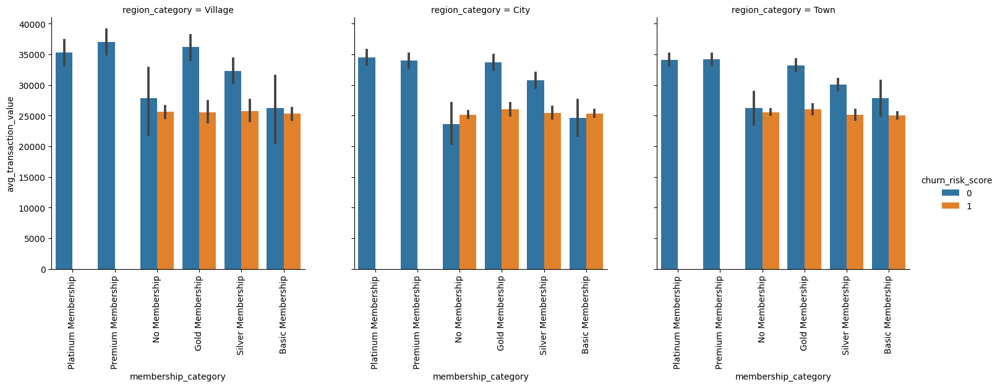

In [89]:
ax = sns.catplot(x='membership_category',y='avg_transaction_value',data=df,hue='churn_risk_score',col='region_category',kind='bar',height=5,aspect=1)

for g in ax.axes:
    ax.set_xticklabels(rotation=90)

It is clearly evident that the customers having Platinum and Premium membership have realistically no chance of churn. They are almost certain to stay for long term. Moreover, customers possessing Platinum and Premier membership have significant average transaction values.

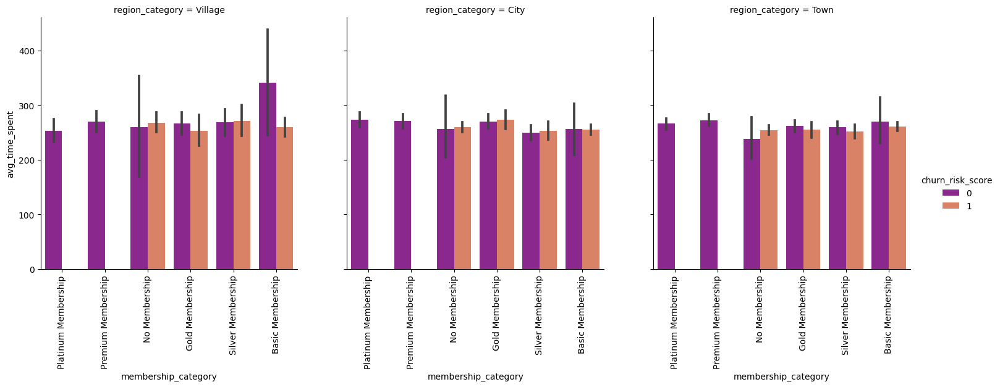

In [90]:
ax = sns.catplot(x='membership_category',y='avg_time_spent',data=df,hue='churn_risk_score',col='region_category',kind='bar',height=5,aspect=1,palette='plasma')

for g in ax.axes:
    ax.set_xticklabels(rotation=90)

Among the customers residing in villages who are unlikely to churn, the ones with basic membership spend the maximum amount of time on the company's online apps and websites whereas those with platinum membership expend the least.

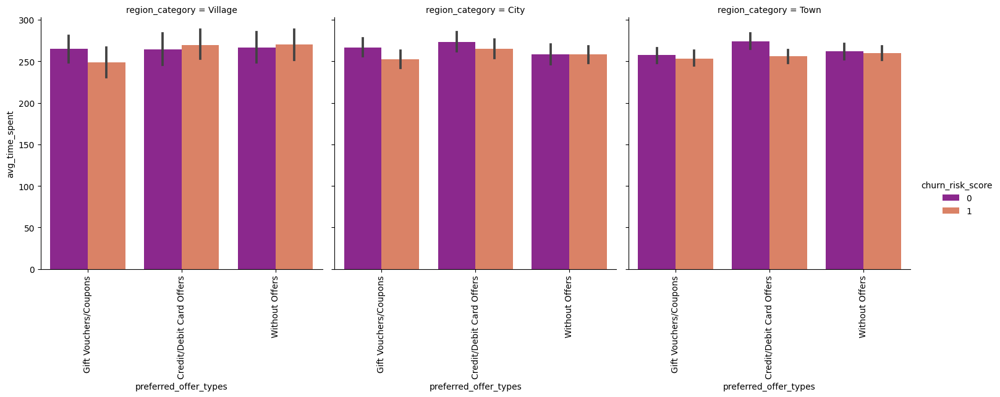

In [91]:
ax = sns.catplot(x='preferred_offer_types',y='avg_time_spent',data=df,hue='churn_risk_score',col='region_category',kind='bar',height=5,aspect=1,palette='plasma')

for g in ax.axes:
    ax.set_xticklabels(rotation=90)

In both cities as well as towns, the customers whose preferred offer type is "Credit/Debit Card Offers" spend a signficant amount of time on company's online platforms. However, as far as the customers living in villages are concerned, those without any offers expend the maximum amount of time on the company's online platforms.

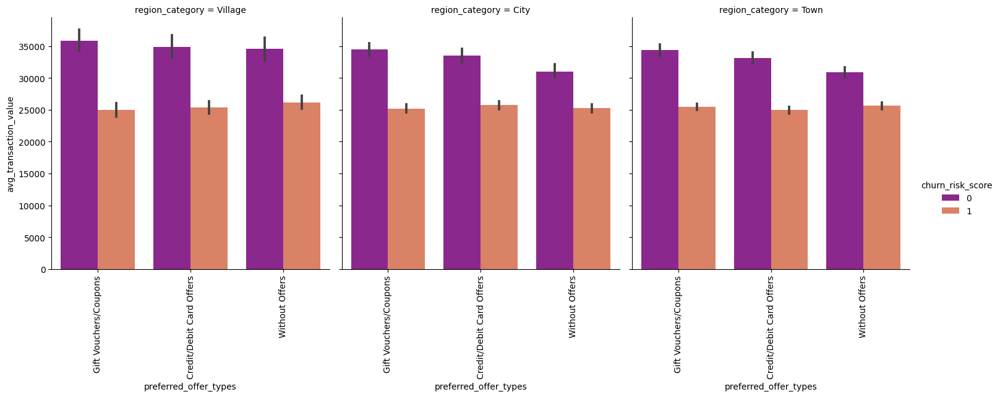

In [92]:
ax = sns.catplot(x='preferred_offer_types',y='avg_transaction_value',data=df,hue='churn_risk_score',col='region_category',kind='bar',height=5,aspect=1,palette='plasma')

for g in ax.axes:
    ax.set_xticklabels(rotation=90)

At an average, the customers who prefer "Gift Vouchers/Coupens" are the ones who spend the highest amount of money on the company's products and services.

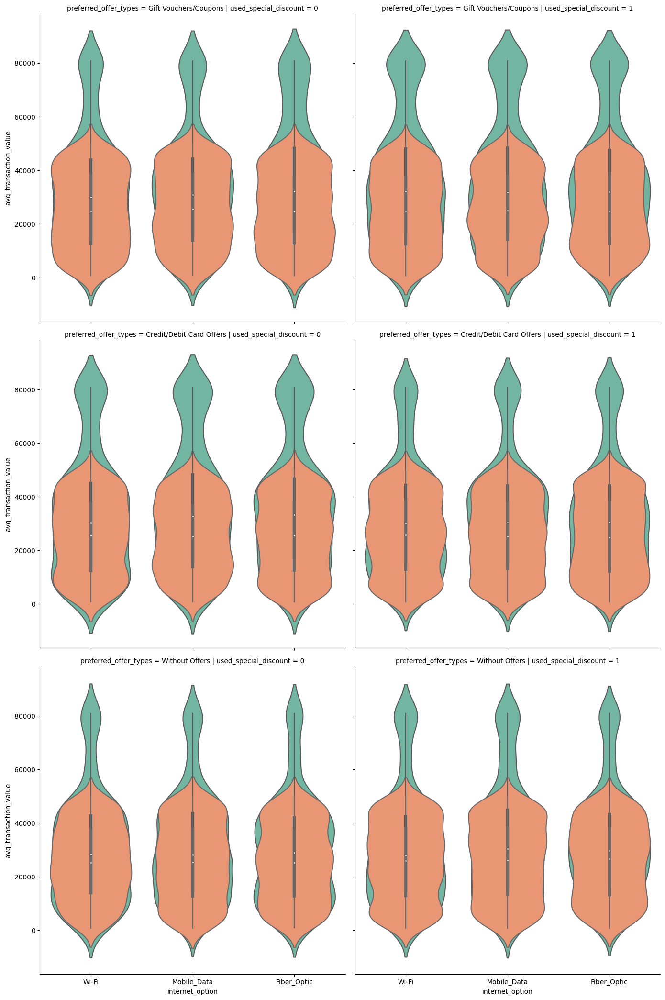

In [93]:
g = sns.FacetGrid(df,row='preferred_offer_types',col='used_special_discount',hue='churn_risk_score',palette='Set2',height=7,aspect=1)
g.map(sns.violinplot,'internet_option','avg_transaction_value')

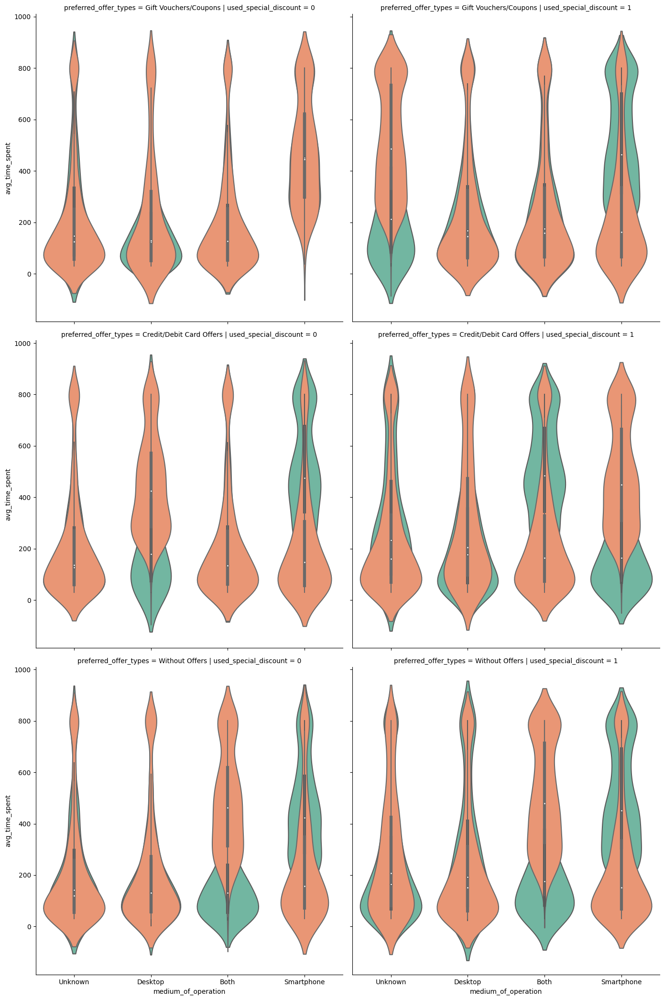

In [94]:
g = sns.FacetGrid(df,row='preferred_offer_types',col='used_special_discount',hue='churn_risk_score',palette='Set2',height=7,aspect=1)
g.map(sns.violinplot,'medium_of_operation','avg_time_spent')

In [95]:
dummy_col = ['region_category', 'membership_category','preferred_offer_types', 'medium_of_operation', 'internet_option']

In [96]:
for col in dummy_col:
    print(col,':')
    encoder = LabelEncoder()
    df[col] = encoder.fit_transform(df[col])
    df[col] = df[col].astype(int)
    print(encoder.classes_, encoder.transform(encoder.classes_))

region_category :
['City' 'Town' 'Village'] [0 1 2]
membership_category :
['Basic Membership' 'Gold Membership' 'No Membership'
 'Platinum Membership' 'Premium Membership' 'Silver Membership'] [0 1 2 3 4 5]
preferred_offer_types :
['Credit/Debit Card Offers' 'Gift Vouchers/Coupons' 'Without Offers'] [0 1 2]
medium_of_operation :
['Both' 'Desktop' 'Smartphone' 'Unknown'] [0 1 2 3]
internet_option :
['Fiber_Optic' 'Mobile_Data' 'Wi-Fi'] [0 1 2]


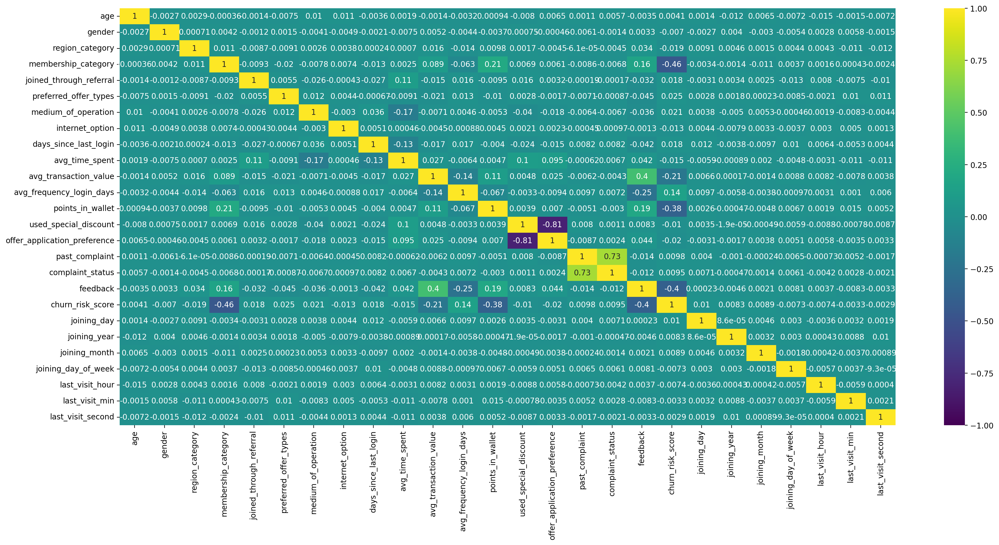

In [97]:
plt.figure(figsize=(20,10),dpi=200)
sns.heatmap(df.corr(),annot=True,cmap='viridis',vmin=-1,vmax=1)
plt.tight_layout()

## Splitting the dataset into feature columns and the target label

In [98]:
X = df.drop('churn_risk_score',axis=1)
y = df.churn_risk_score

In [99]:
X.avg_frequency_login_days.fillna(X.avg_frequency_login_days.mean(),inplace=True)

## Feature Scaling

In [100]:
scaler = StandardScaler()
features = X.columns
X = scaler.fit_transform(X.values)
X = pd.DataFrame(X,columns=features)
X.head()

,age,gender,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,...,past_complaint,complaint_status,feedback,joining_day,joining_year,joining_month,joining_day_of_week,last_visit_hour,last_visit_min,last_visit_second
0,-1.204789,-0.986044,1.868809,0.435008,-0.396803,0.006201,1.663530,1.219684,0.760478,0.163933,...,-0.993188,-0.728082,2.059661,0.149145,1.211944,0.422288,-0.001230,0.645468,-1.251851,-1.583789
1,-0.322106,-0.986044,-1.203930,1.010522,-1.819784,0.006201,-0.653368,-0.003851,0.580872,0.187749,...,1.006858,1.607577,2.059661,1.398732,1.211944,0.422288,-1.502334,0.067344,0.481584,-0.952320
2,0.434478,-0.986044,0.332439,-0.140506,1.026178,0.006201,-0.653368,1.219684,0.221658,1.062879,...,1.006858,1.607577,-0.634593,-0.532448,-0.009336,1.290853,0.499138,1.512654,1.348301,-0.493071
3,-0.006863,1.002136,-1.203930,-0.140506,1.026178,0.006201,-0.653368,-0.003851,-0.317163,-0.867771,...,1.006858,0.439748,-0.634593,1.512331,-0.009336,1.001332,0.999506,0.500937,1.579426,1.171709
4,-0.385155,-0.986044,-1.203930,-0.140506,-0.396803,-1.225137,0.505081,-0.003851,1.299299,-0.618103,...,1.006858,1.607577,-0.634593,-0.418849,1.211944,0.711810,-1.001966,0.500937,0.943833,0.827272


In [101]:
# pd.DataFrame(index=X.columns, data=scaler.scale_,columns=['Scaling Factor'])

## Dividing the dataset into training and test sets

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=101)

## Model Training & Evaluation

## Logistic Regression

In [103]:
log_model = LogisticRegression()
log_model.fit(X_train,y_train)

LogisticRegression()

              precision    recall  f1-score   support

           0       0.76      0.74      0.75      2301
           1       0.78      0.81      0.79      2703

    accuracy                           0.77      5004
   macro avg       0.77      0.77      0.77      5004
weighted avg       0.77      0.77      0.77      5004



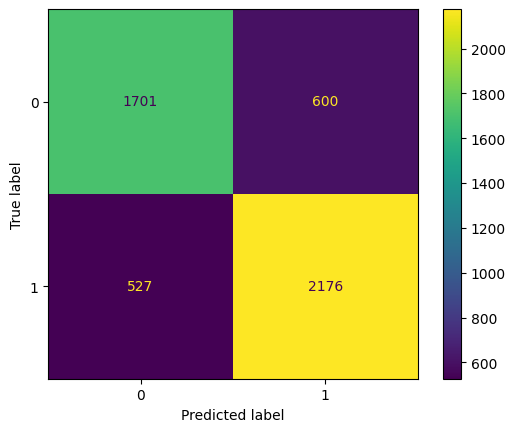

In [106]:
lr_pred = log_model.predict(X_test)
print(metrics.classification_report(y_test,lr_pred))
metrics.ConfusionMatrixDisplay.from_estimator(log_model,X_test,y_test)

## Optimization of Logistic Regression using GridSearchCV

In [107]:
base_lr = LogisticRegression(class_weight='balanced',max_iter=10000)

In [108]:
param_grid = {'penalty': ['l1','l2','elasticnet'],
              'C': [0.001,0.01,0.1,0.5],
              'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'multi_class': ['ovr', 'multinomial'],
              'l1_ratio': [0.2,0.5,0.8]
             }

In [109]:
grid_lr = GridSearchCV(base_lr,param_grid)
grid_lr.fit(X_train,y_train)

GridSearchCV(estimator=LogisticRegression(class_weight='balanced',
                                          max_iter=10000),
             param_grid={'C': [0.001, 0.01, 0.1, 0.5],
                         'l1_ratio': [0.2, 0.5, 0.8],
                         'multi_class': ['ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']})

In [110]:
grid_lr.best_params_

{'C': 0.001,
 'l1_ratio': 0.2,
 'multi_class': 'ovr',
 'penalty': 'l1',
 'solver': 'liblinear'}

              precision    recall  f1-score   support

           0       0.76      0.78      0.77      2301
           1       0.81      0.79      0.80      2703

    accuracy                           0.79      5004
   macro avg       0.78      0.79      0.78      5004
weighted avg       0.79      0.79      0.79      5004



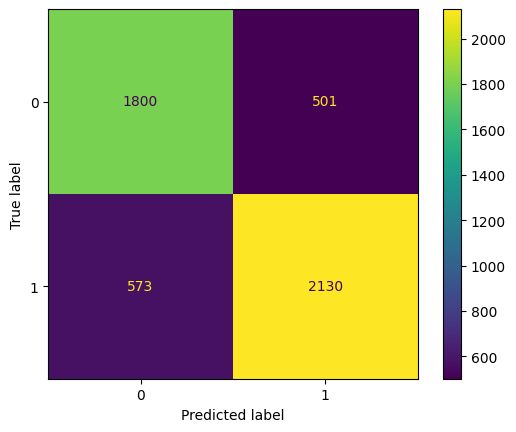

In [111]:
grid_lr_pred = grid_lr.predict(X_test)
print(metrics.classification_report(y_test,grid_lr_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_lr,X_test,y_test)

## K Nearest Neighbors Classifier

In [112]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

              precision    recall  f1-score   support

           0       0.75      0.70      0.72      2301
           1       0.76      0.81      0.78      2703

    accuracy                           0.76      5004
   macro avg       0.76      0.75      0.75      5004
weighted avg       0.76      0.76      0.75      5004



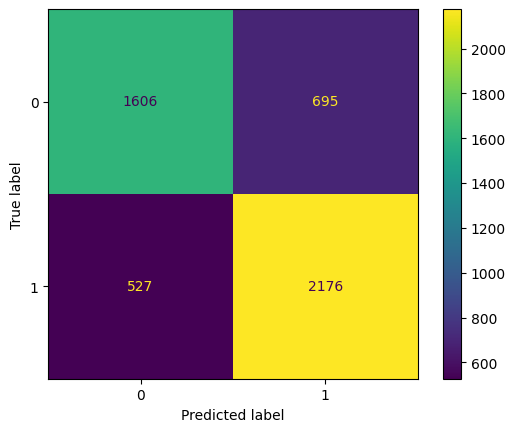

In [113]:
knn_pred = knn.predict(X_test)
print(metrics.classification_report(y_test,knn_pred))
metrics.ConfusionMatrixDisplay.from_estimator(knn,X_test,y_test)

## Support Vector Classifier

In [114]:
svm = SVC()
svm.fit(X_train,y_train)

SVC()

              precision    recall  f1-score   support

           0       0.84      0.76      0.80      2301
           1       0.81      0.88      0.85      2703

    accuracy                           0.83      5004
   macro avg       0.83      0.82      0.82      5004
weighted avg       0.83      0.83      0.83      5004



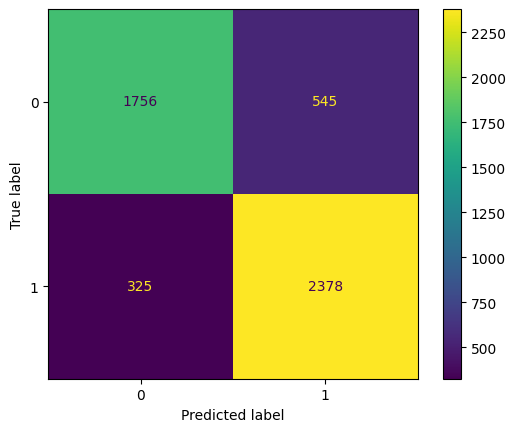

In [115]:
svm_pred = svm.predict(X_test)
print(metrics.classification_report(y_test,svm_pred))
metrics.ConfusionMatrixDisplay.from_estimator(svm,X_test,y_test)

## Decision Tree Classifier

In [116]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      2301
           1       0.92      0.90      0.91      2703

    accuracy                           0.91      5004
   macro avg       0.91      0.91      0.91      5004
weighted avg       0.91      0.91      0.91      5004



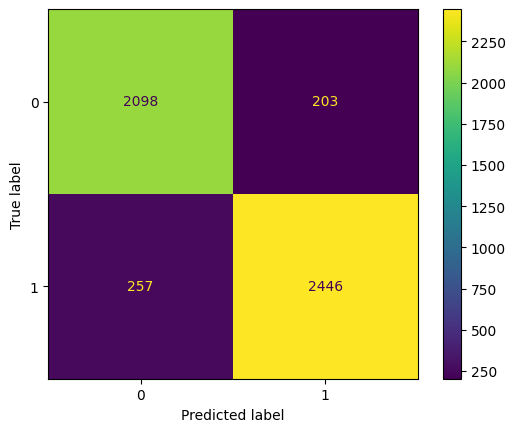

In [117]:
dtree_pred = dtree.predict(X_test)
print(metrics.classification_report(y_test,dtree_pred))
metrics.ConfusionMatrixDisplay.from_estimator(dtree,X_test,y_test)

## Random Forest Classifier

In [118]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)

RandomForestClassifier()

              precision    recall  f1-score   support

           0       0.94      0.91      0.92      2301
           1       0.92      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



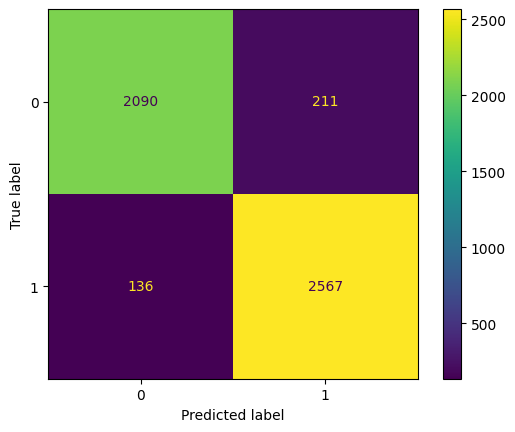

In [119]:
rfc_pred = rfc.predict(X_test)
print(metrics.classification_report(y_test,rfc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(rfc,X_test,y_test)

## Gaussian Naive Bayes

In [120]:
gnb = GaussianNB()
gnb.fit(X_train,y_train)

GaussianNB()

              precision    recall  f1-score   support

           0       0.79      0.62      0.69      2301
           1       0.73      0.86      0.79      2703

    accuracy                           0.75      5004
   macro avg       0.76      0.74      0.74      5004
weighted avg       0.75      0.75      0.74      5004



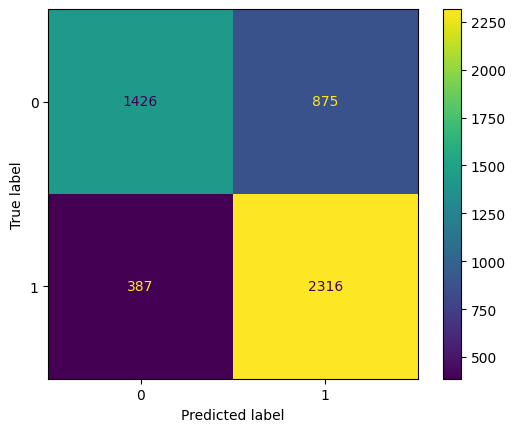

In [121]:
gnb_pred = gnb.predict(X_test)
print(metrics.classification_report(y_test,gnb_pred))
metrics.ConfusionMatrixDisplay.from_estimator(gnb,X_test,y_test)

## Bernoulli Naive Bayes

In [122]:
bnb = BernoulliNB()
bnb.fit(X_train,y_train)

BernoulliNB()

              precision    recall  f1-score   support

           0       0.84      0.78      0.81      2301
           1       0.82      0.87      0.85      2703

    accuracy                           0.83      5004
   macro avg       0.83      0.83      0.83      5004
weighted avg       0.83      0.83      0.83      5004



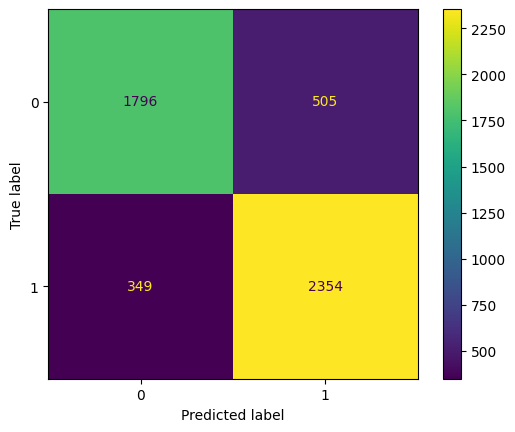

In [123]:
bnb_pred = bnb.predict(X_test)
print(metrics.classification_report(y_test,bnb_pred))
metrics.ConfusionMatrixDisplay.from_estimator(bnb,X_test,y_test)

## Adaptive Boosting Classifier

In [124]:
ada = AdaBoostClassifier()
ada.fit(X_train,y_train)

AdaBoostClassifier()

              precision    recall  f1-score   support

           0       0.95      0.90      0.92      2301
           1       0.92      0.96      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



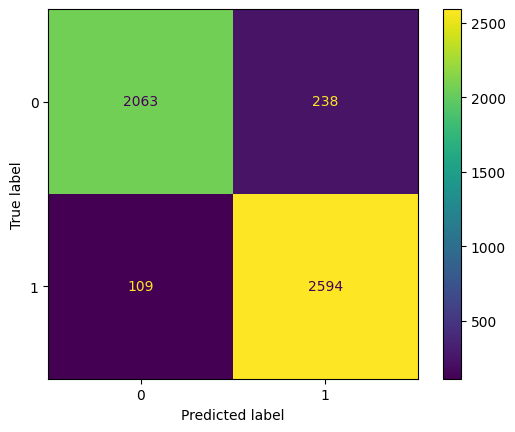

In [125]:
ada_pred = ada.predict(X_test)
print(metrics.classification_report(y_test,ada_pred))
metrics.ConfusionMatrixDisplay.from_estimator(ada,X_test,y_test)

## Gradient Boosting Classifier

In [126]:
gbc = GradientBoostingClassifier()
gbc.fit(X_train,y_train)

GradientBoostingClassifier()

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2301
           1       0.94      0.94      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



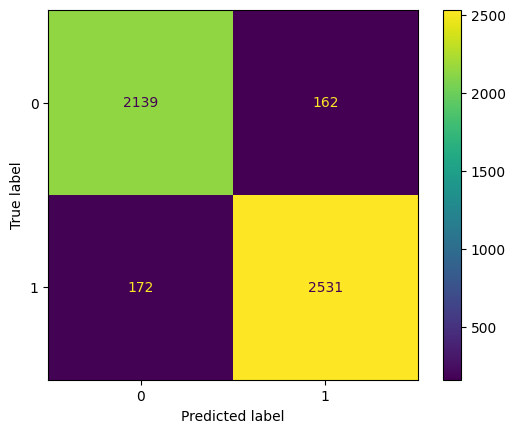

In [127]:
gbc_pred = gbc.predict(X_test)
print(metrics.classification_report(y_test,gbc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(gbc,X_test,y_test)

## Stochastic Gradient Descent Classifier

In [128]:
sgd = SGDClassifier()
sgd.fit(X_train,y_train)

SGDClassifier()

              precision    recall  f1-score   support

           0       0.76      0.75      0.76      2301
           1       0.79      0.79      0.79      2703

    accuracy                           0.78      5004
   macro avg       0.77      0.77      0.77      5004
weighted avg       0.78      0.78      0.78      5004



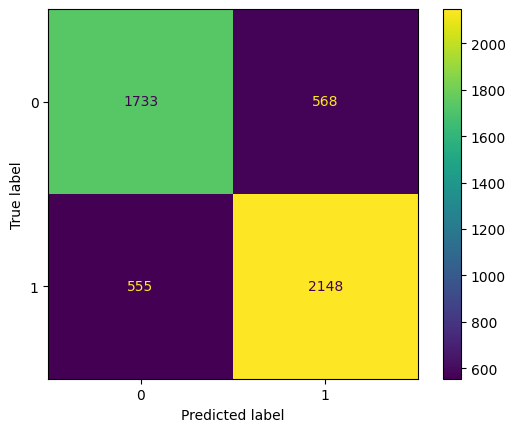

In [129]:
sgd_pred = sgd.predict(X_test)
print(metrics.classification_report(y_test,sgd_pred))
metrics.ConfusionMatrixDisplay.from_estimator(sgd,X_test,y_test)

## Passive Aggressive Classifier

In [130]:
pac = PassiveAggressiveClassifier()
pac.fit(X_train,y_train)

PassiveAggressiveClassifier()

              precision    recall  f1-score   support

           0       0.61      0.67      0.64      2301
           1       0.69      0.63      0.66      2703

    accuracy                           0.65      5004
   macro avg       0.65      0.65      0.65      5004
weighted avg       0.65      0.65      0.65      5004



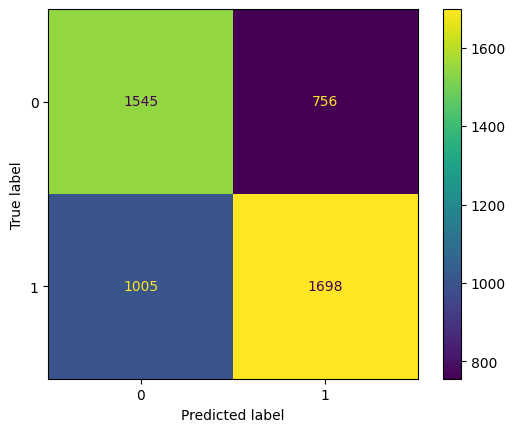

In [131]:
pac_pred = pac.predict(X_test)
print(metrics.classification_report(y_test,pac_pred))
metrics.ConfusionMatrixDisplay.from_estimator(pac,X_test,y_test)

## Ridge Classifier

In [132]:
ridge = RidgeClassifier()
ridge.fit(X_train,y_train)

RidgeClassifier()

              precision    recall  f1-score   support

           0       0.77      0.73      0.75      2301
           1       0.78      0.82      0.80      2703

    accuracy                           0.78      5004
   macro avg       0.78      0.77      0.77      5004
weighted avg       0.78      0.78      0.78      5004



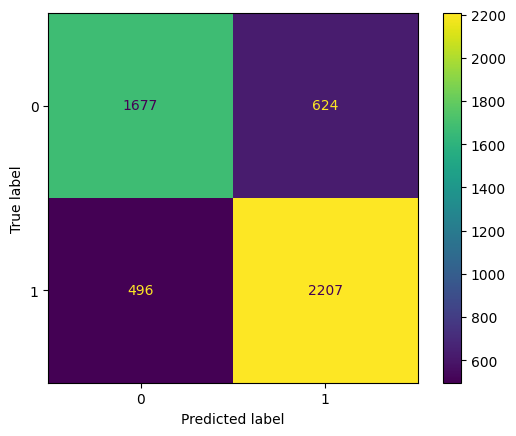

In [133]:
ridge_pred = ridge.predict(X_test)
print(metrics.classification_report(y_test,ridge_pred))
metrics.ConfusionMatrixDisplay.from_estimator(ridge,X_test,y_test)

## Light Gradient Boosting Model

In [134]:
lgbm = LGBMClassifier()
lgbm.fit(X_train,y_train)

[LightGBM] [Info] Number of positive: 15291, number of negative: 13063
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003916 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1356
[LightGBM] [Info] Number of data points in the train set: 28354, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.539289 -> initscore=0.157481
[LightGBM] [Info] Start training from score 0.157481


LGBMClassifier()

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



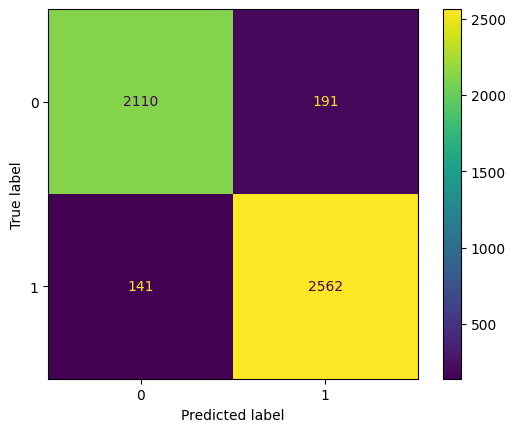

In [135]:
lgbm_pred = lgbm.predict(X_test)
print(metrics.classification_report(y_test,lgbm_pred))
metrics.ConfusionMatrixDisplay.from_estimator(lgbm,X_test,y_test)

## XG Boost Classifier

In [136]:
xgb = XGBClassifier()
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

              precision    recall  f1-score   support

           0       0.94      0.91      0.92      2301
           1       0.92      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



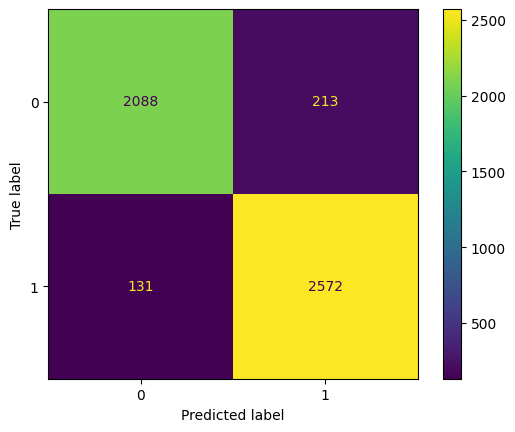

In [137]:
xgb_pred = xgb.predict(X_test)
print(metrics.classification_report(y_test,xgb_pred))
metrics.ConfusionMatrixDisplay.from_estimator(xgb,X_test,y_test)

## Categorical Boosting Classifier

In [138]:
cat = CatBoostClassifier()
cat.fit(X_train,y_train)

Learning rate set to 0.042973
0:	learn: 0.6235423	total: 211ms	remaining: 3m 31s
1:	learn: 0.5609754	total: 240ms	remaining: 1m 59s
2:	learn: 0.5082226	total: 263ms	remaining: 1m 27s
3:	learn: 0.4608233	total: 284ms	remaining: 1m 10s
4:	learn: 0.4248457	total: 306ms	remaining: 1m
5:	learn: 0.3915537	total: 329ms	remaining: 54.4s
6:	learn: 0.3690422	total: 350ms	remaining: 49.7s
7:	learn: 0.3443889	total: 372ms	remaining: 46.1s
8:	learn: 0.3237516	total: 393ms	remaining: 43.3s
9:	learn: 0.3100405	total: 415ms	remaining: 41s
10:	learn: 0.2978036	total: 436ms	remaining: 39.2s
11:	learn: 0.2847090	total: 458ms	remaining: 37.7s
12:	learn: 0.2707202	total: 480ms	remaining: 36.5s
13:	learn: 0.2615032	total: 500ms	remaining: 35.2s
14:	learn: 0.2515949	total: 521ms	remaining: 34.2s
15:	learn: 0.2436717	total: 543ms	remaining: 33.4s
16:	learn: 0.2364214	total: 567ms	remaining: 32.8s
17:	learn: 0.2291640	total: 593ms	remaining: 32.3s
18:	learn: 0.2233805	total: 618ms	remaining: 31.9s
19:	learn: 0

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



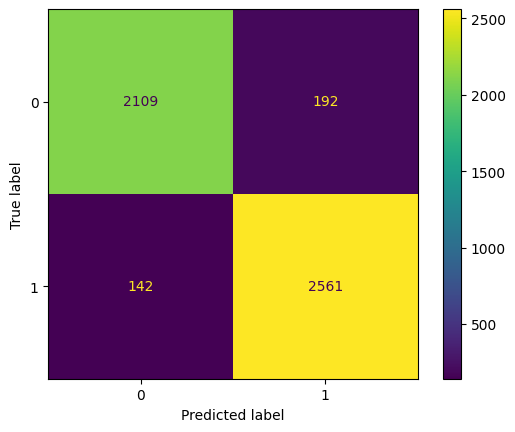

In [139]:
cat_pred = cat.predict(X_test)
print(metrics.classification_report(y_test,cat_pred))
metrics.ConfusionMatrixDisplay.from_estimator(cat,X_test,y_test)

## Histogram-based Gradient Boosting Classifier

In [140]:
hist = HistGradientBoostingClassifier()
hist.fit(X_train,y_train)

HistGradientBoostingClassifier()

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.94      5004
   macro avg       0.94      0.94      0.94      5004
weighted avg       0.94      0.94      0.94      5004



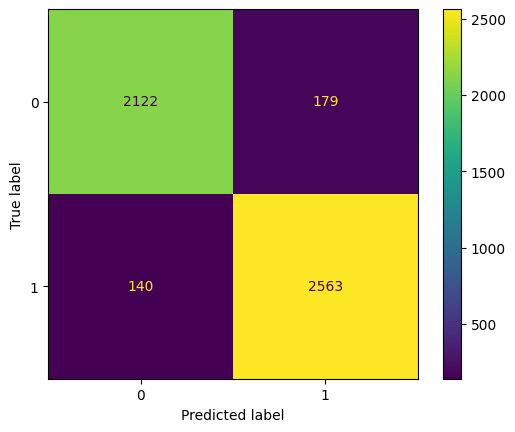

In [141]:
hist_pred = hist.predict(X_test)
print(metrics.classification_report(y_test,hist_pred))
metrics.ConfusionMatrixDisplay.from_estimator(hist,X_test,y_test)

## Extra Trees Classifier

In [142]:
et = ExtraTreesClassifier()
et.fit(X_train,y_train)

ExtraTreesClassifier()

              precision    recall  f1-score   support

           0       0.93      0.91      0.92      2301
           1       0.92      0.94      0.93      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.92      0.93      5004
weighted avg       0.93      0.93      0.93      5004



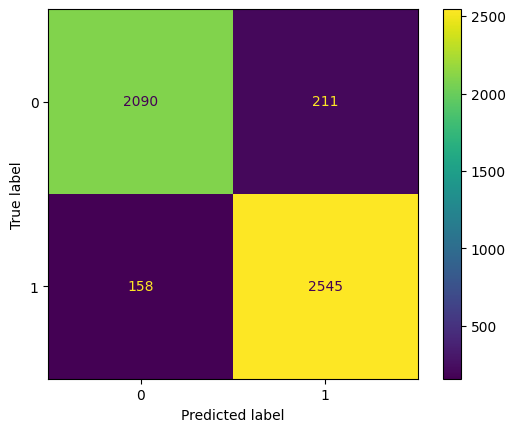

In [143]:
et_pred = et.predict(X_test)
print(metrics.classification_report(y_test,et_pred))
metrics.ConfusionMatrixDisplay.from_estimator(et,X_test,y_test)

## Bagging Classifier

In [144]:
bag = BaggingClassifier()
bag.fit(X_train,y_train)

BaggingClassifier()

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2301
           1       0.94      0.94      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



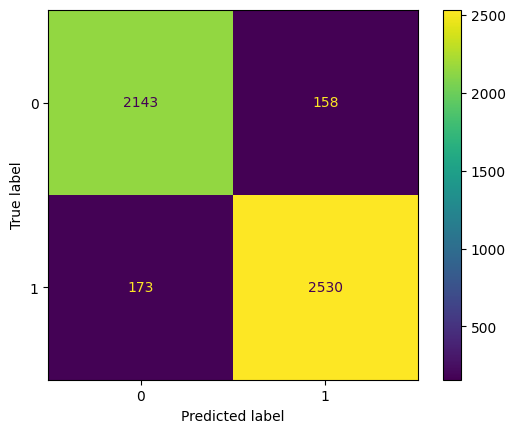

In [145]:
bag_pred = bag.predict(X_test)
print(metrics.classification_report(y_test,bag_pred))
metrics.ConfusionMatrixDisplay.from_estimator(bag,X_test,y_test)

## Voting Classifier

In [146]:
vc = VotingClassifier(estimators=[
    ('RF',RandomForestClassifier()),
    ('LGBM',LGBMClassifier()),
    ('CAT',CatBoostClassifier()),
    ('HIST',HistGradientBoostingClassifier()),
    ('XGB',XGBClassifier()),
    ('BAG',BaggingClassifier()),
    ('ADA',AdaBoostClassifier())
],voting='hard')

In [147]:
vc.fit(X_train.values,y_train.values)

[LightGBM] [Info] Number of positive: 15291, number of negative: 13063
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1356
[LightGBM] [Info] Number of data points in the train set: 28354, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.539289 -> initscore=0.157481
[LightGBM] [Info] Start training from score 0.157481
Learning rate set to 0.042973
0:	learn: 0.6235423	total: 25.5ms	remaining: 25.4s
1:	learn: 0.5609754	total: 52.5ms	remaining: 26.2s
2:	learn: 0.5082226	total: 73.3ms	remaining: 24.4s
3:	learn: 0.4608233	total: 95.1ms	remaining: 23.7s
4:	learn: 0.4248457	total: 117ms	remaining: 23.2s
5:	learn: 0.3915537	total: 141ms	remaining: 23.4s
6:	learn: 0.3690422	total: 163ms	remaining: 23.1s
7:	learn: 0.3443889	total: 186ms	remaining: 23.1s
8:	learn: 

VotingClassifier(estimators=[('RF', RandomForestClassifier()),
                             ('LGBM', LGBMClassifier()),
                             ('CAT',
                              <catboost.core.CatBoostClassifier object at 0x000001810896B290>),
                             ('HIST', HistGradientBoostingClassifier()),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_round...
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...)),
                             ('BAG', BaggingClassifier()),
                             ('ADA', AdaBoostClassifier())])

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



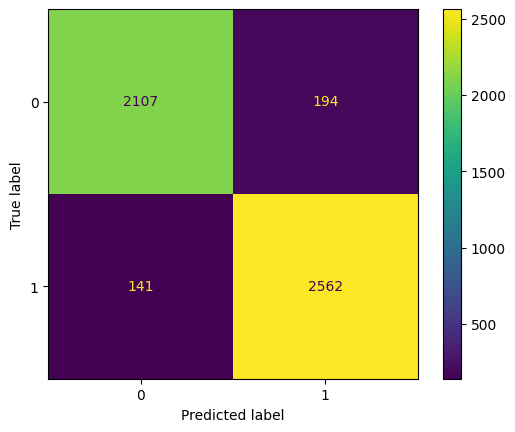

In [148]:
vc_pred = vc.predict(X_test.values)
print(metrics.classification_report(y_test.values,vc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(vc,X_test.values,y_test.values)

## Hyperparameter Tuning for all models using RandomizedSearchCV

### For KNN

In [149]:
base_knn = KNeighborsClassifier()

In [150]:
param_grid = {'n_neighbors': [2,5,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'kd_tree', 'brute'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev']
             }

In [151]:
grid_knn = RandomizedSearchCV(base_knn,param_grid,verbose=3)
grid_knn.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END algorithm=ball_tree, metric=euclidean, n_neighbors=20, weights=uniform;, score=0.783 total time=  15.1s
[CV 2/5] END algorithm=ball_tree, metric=euclidean, n_neighbors=20, weights=uniform;, score=0.785 total time=  10.1s
[CV 3/5] END algorithm=ball_tree, metric=euclidean, n_neighbors=20, weights=uniform;, score=0.793 total time=  10.4s
[CV 4/5] END algorithm=ball_tree, metric=euclidean, n_neighbors=20, weights=uniform;, score=0.784 total time=   9.5s
[CV 5/5] END algorithm=ball_tree, metric=euclidean, n_neighbors=20, weights=uniform;, score=0.785 total time=   9.2s
[CV 1/5] END algorithm=ball_tree, metric=manhattan, n_neighbors=5, weights=distance;, score=0.803 total time=   9.2s
[CV 2/5] END algorithm=ball_tree, metric=manhattan, n_neighbors=5, weights=distance;, score=0.796 total time=  10.0s
[CV 3/5] END algorithm=ball_tree, metric=manhattan, n_neighbors=5, weights=distance;, score=0.794 total time=   9.6s
[CV

RandomizedSearchCV(estimator=KNeighborsClassifier(),
                   param_distributions={'algorithm': ['ball_tree', 'kd_tree',
                                                      'brute'],
                                        'metric': ['minkowski', 'manhattan',
                                                   'euclidean', 'chebyshev'],
                                        'n_neighbors': [2, 5, 8, 12, 20],
                                        'weights': ['uniform', 'distance']},
                   verbose=3)

In [152]:
grid_knn.best_params_

{'weights': 'uniform',
 'n_neighbors': 5,
 'metric': 'manhattan',
 'algorithm': 'ball_tree'}

              precision    recall  f1-score   support

           0       0.80      0.72      0.76      2301
           1       0.78      0.85      0.81      2703

    accuracy                           0.79      5004
   macro avg       0.79      0.78      0.79      5004
weighted avg       0.79      0.79      0.79      5004



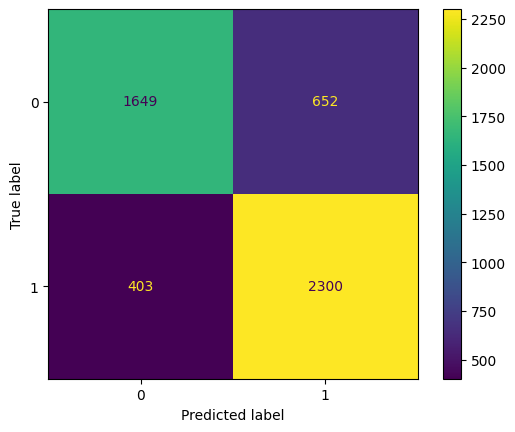

In [154]:
grid_knn_pred = grid_knn.predict(X_test)
print(metrics.classification_report(y_test,grid_knn_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_knn,X_test,y_test)

## Elbow Method

Text(0.5, 1.0, 'Error Distribution across K Neighbors')

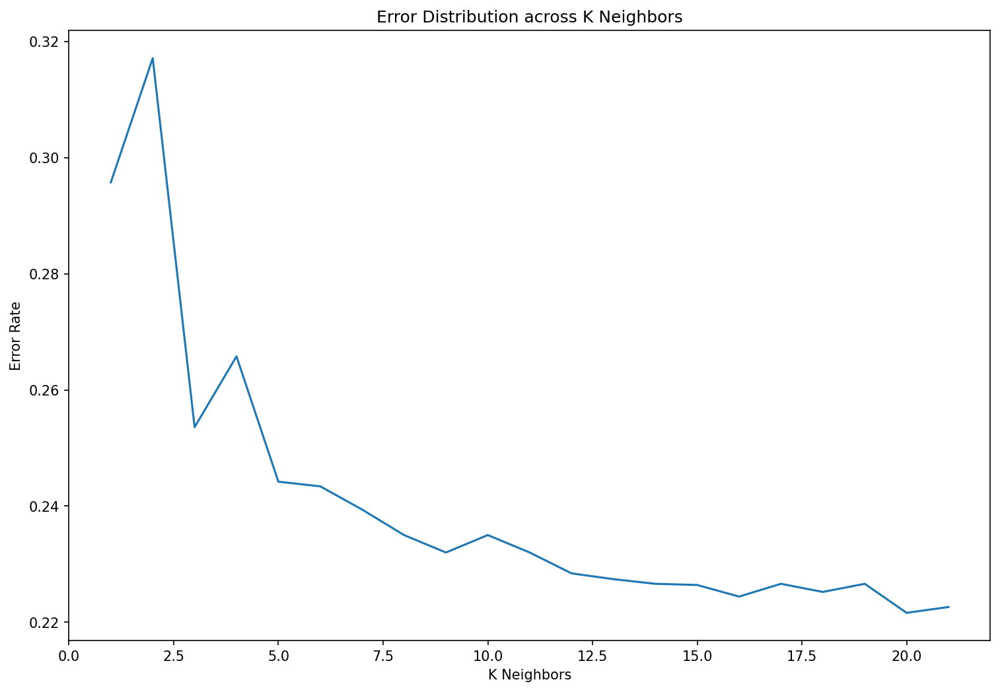

In [156]:
errors = []

for i in range(1,22):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    knn_pred = knn.predict(X_test)
    errors.append(1-metrics.accuracy_score(y_test,knn_pred))
    
plt.figure(figsize=(12,8),dpi=150)
sns.lineplot(x=range(1,22), y=errors)
plt.xlabel('K Neighbors')
plt.ylabel('Error Rate')
plt.title('Error Distribution across K Neighbors')

### For SVM

In [157]:
base_svc = SVC(class_weight='balanced',max_iter=10000)

In [158]:
param_grid = {'C': [0.01,0.5,5,25,50],
             'gamma': ['scale','auto'],
             'kernel': ['linear','poly','rbf','sigmoid'],
             'degree': [2,3,4,5],
             'shrinking': [True,False]
             }

In [159]:
grid_svc = RandomizedSearchCV(base_svc,param_grid,verbose=3)
grid_svc.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END C=0.01, degree=5, gamma=scale, kernel=rbf, shrinking=False;, score=0.539 total time=  35.3s
[CV 2/5] END C=0.01, degree=5, gamma=scale, kernel=rbf, shrinking=False;, score=0.539 total time=  34.1s
[CV 3/5] END C=0.01, degree=5, gamma=scale, kernel=rbf, shrinking=False;, score=0.539 total time=  35.4s
[CV 4/5] END C=0.01, degree=5, gamma=scale, kernel=rbf, shrinking=False;, score=0.539 total time=  34.3s
[CV 5/5] END C=0.01, degree=5, gamma=scale, kernel=rbf, shrinking=False;, score=0.539 total time=  35.1s
[CV 1/5] END C=50, degree=3, gamma=scale, kernel=poly, shrinking=False;, score=0.721 total time=  17.5s
[CV 2/5] END C=50, degree=3, gamma=scale, kernel=poly, shrinking=False;, score=0.729 total time=  18.0s
[CV 3/5] END C=50, degree=3, gamma=scale, kernel=poly, shrinking=False;, score=0.738 total time=  17.6s
[CV 4/5] END C=50, degree=3, gamma=scale, kernel=poly, shrinking=False;, score=0.727 total time=  19.1

RandomizedSearchCV(estimator=SVC(class_weight='balanced', max_iter=10000),
                   param_distributions={'C': [0.01, 0.5, 5, 25, 50],
                                        'degree': [2, 3, 4, 5],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid'],
                                        'shrinking': [True, False]},
                   verbose=3)

In [160]:
grid_svc.best_params_

{'shrinking': True, 'kernel': 'rbf', 'gamma': 'scale', 'degree': 4, 'C': 0.5}

              precision    recall  f1-score   support

           0       0.79      0.80      0.80      2301
           1       0.83      0.82      0.82      2703

    accuracy                           0.81      5004
   macro avg       0.81      0.81      0.81      5004
weighted avg       0.81      0.81      0.81      5004



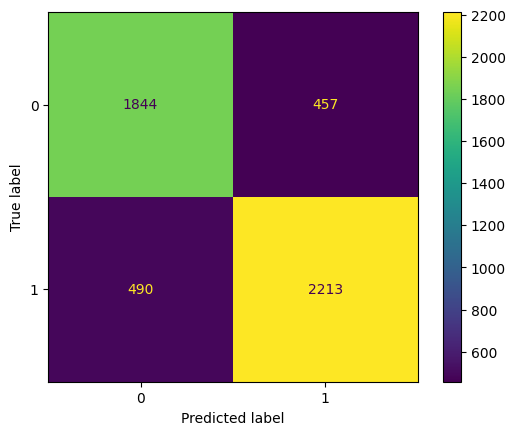

In [161]:
grid_svc_pred = grid_svc.predict(X_test)
print(metrics.classification_report(y_test,grid_svc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_svc,X_test,y_test)

### For Decision Tree Classifier

In [162]:
base_dtree = DecisionTreeClassifier(class_weight='balanced',random_state=101)

In [163]:
param_grid = {'criterion': ['gini','entropy'],
              'max_features': ['sqrt','log2'],
              'max_depth': [2,12,38,68,98,128,201]
             }

In [164]:
grid_dtree = RandomizedSearchCV(base_dtree,param_grid,verbose=4,cv=RepeatedStratifiedKFold(n_splits=6,n_repeats=3))
grid_dtree.fit(X_train,y_train)

Fitting 18 folds for each of 10 candidates, totalling 180 fits
[CV 1/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.839 total time=   0.1s
[CV 2/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.866 total time=   0.1s
[CV 3/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.815 total time=   0.1s
[CV 4/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.869 total time=   0.0s
[CV 5/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.858 total time=   0.0s
[CV 6/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.859 total time=   0.1s
[CV 7/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.873 total time=   0.1s
[CV 8/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.870 total time=   0.0s
[CV 9/18] END criterion=gini, max_depth=201, max_features=log2;, score=0.853 total time=   0.0s
[CV 10/18] END criterion=gini, max_depth=201, max_features=log2;, score=0

RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=6, random_state=None),
                   estimator=DecisionTreeClassifier(class_weight='balanced',
                                                    random_state=101),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 12, 38, 68, 98, 128,
                                                      201],
                                        'max_features': ['sqrt', 'log2']},
                   verbose=4)

In [165]:
grid_dtree.best_estimator_.get_params()

{'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 12,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 101,
 'splitter': 'best'}

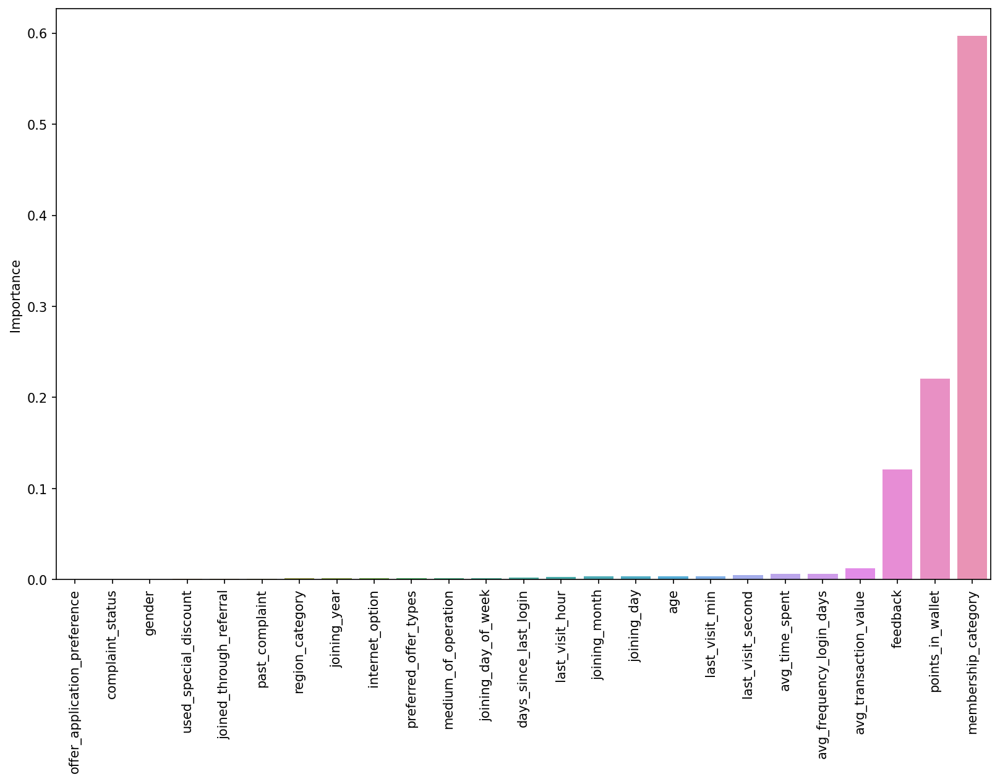

In [166]:
feat_import = pd.DataFrame(index=X.columns,data=grid_dtree.best_estimator_.feature_importances_,columns=['Importance'])
feat_import = feat_import.sort_values("Importance")
feat_import = feat_import[feat_import['Importance']>0.000000]
plt.figure(figsize=(13,8),dpi=150)
sns.barplot(x=feat_import.index,y='Importance',data=feat_import)
plt.xticks(rotation=90);

              precision    recall  f1-score   support

           0       0.91      0.90      0.90      2301
           1       0.92      0.92      0.92      2703

    accuracy                           0.91      5004
   macro avg       0.91      0.91      0.91      5004
weighted avg       0.91      0.91      0.91      5004



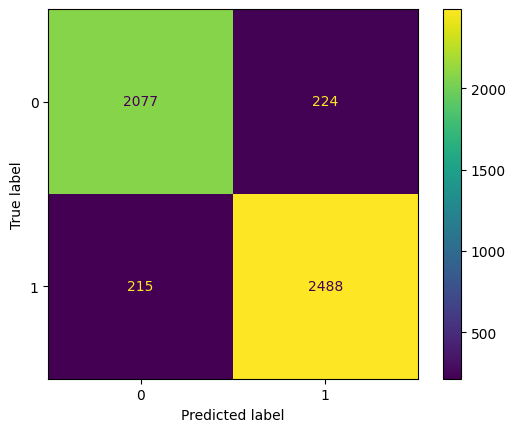

In [167]:
grid_dtree_pred = grid_dtree.predict(X_test)
print(metrics.classification_report(y_test,grid_dtree_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_dtree,X_test,y_test)

### For Random Forest Classifier

In [168]:
base_rfc = RandomForestClassifier(random_state=101,class_weight='balanced')

In [169]:
param_grid = {'n_estimators': [200,460,650,980],
             'criterion': ['gini','entropy'],
             'max_depth': [2,5,20,32,50],
             'max_features': ['sqrt','log2'],
             'bootstrap': [True,False],
             'oob_score': [True,False],
             'max_samples': [0.08,0.42,0.67,1]}

In [170]:
grid_rfc = RandomizedSearchCV(base_rfc,param_grid,verbose=4,random_state=101)
grid_rfc.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, criterion=gini, max_depth=32, max_features=sqrt, max_samples=1, n_estimators=980, oob_score=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, criterion=gini, max_depth=32, max_features=sqrt, max_samples=1, n_estimators=980, oob_score=False;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, criterion=gini, max_depth=32, max_features=sqrt, max_samples=1, n_estimators=980, oob_score=False;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, criterion=gini, max_depth=32, max_features=sqrt, max_samples=1, n_estimators=980, oob_score=False;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, criterion=gini, max_depth=32, max_features=sqrt, max_samples=1, n_estimators=980, oob_score=False;, score=nan total time=   0.0s
[CV 1/5] END bootstrap=True, criterion=entropy, max_depth=50, max_features=sqrt, max_samples=0.67, n_estimators=980, oob_score=False;, score=0.9

RandomizedSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=101),
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 5, 20, 32, 50],
                                        'max_features': ['sqrt', 'log2'],
                                        'max_samples': [0.08, 0.42, 0.67, 1],
                                        'n_estimators': [200, 460, 650, 980],
                                        'oob_score': [True, False]},
                   random_state=101, verbose=4)

In [171]:
grid_rfc.best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': 0.67,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 980,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 101,
 'verbose': 0,
 'warm_start': False}

In [172]:
grid_rfc.best_score_

0.9284051878162265

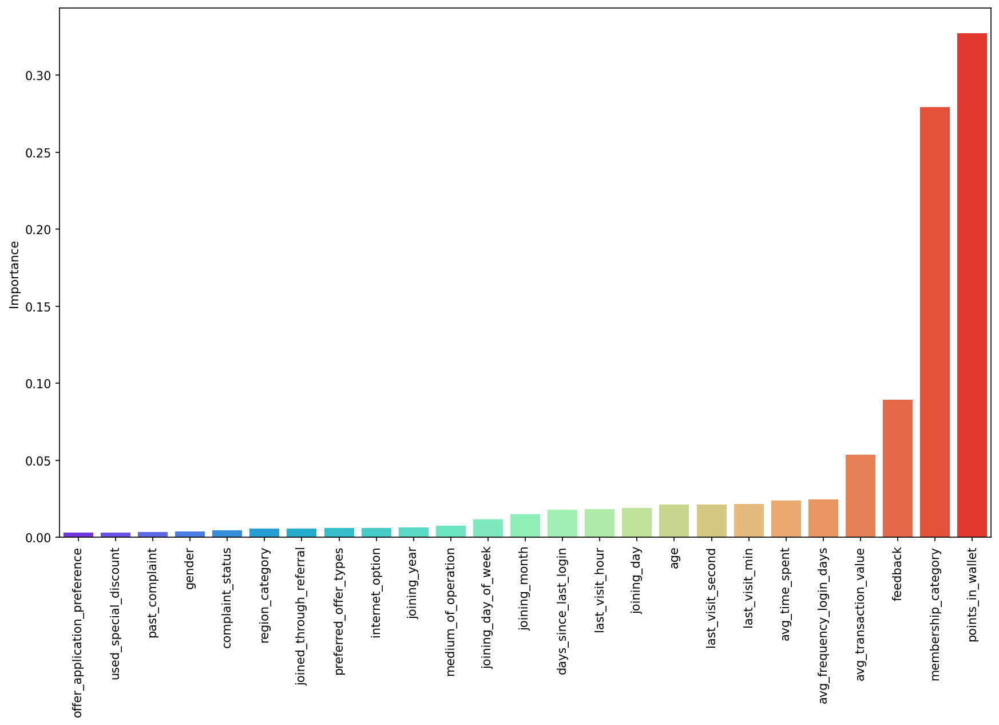

In [173]:
feat_importances = pd.DataFrame(index=X.columns,data=grid_rfc.best_estimator_.feature_importances_,columns=['Importance'])
feat_importances = feat_importances.sort_values("Importance")
feat_importances = feat_importances[feat_importances['Importance']>0.000000000000000]
plt.figure(figsize=(14,8),dpi=150)
sns.barplot(x=feat_importances.index,y='Importance',data=feat_importances,palette='rainbow')
plt.xticks(rotation=90);

In [174]:
grid_rfc.best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': 0.67,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 980,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 101,
 'verbose': 0,
 'warm_start': False}

              precision    recall  f1-score   support

           0       0.94      0.91      0.93      2301
           1       0.92      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



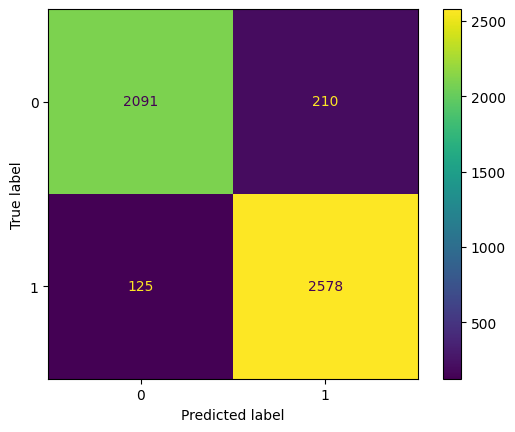

In [175]:
grid_rfc_pred = grid_rfc.predict(X_test)
print(metrics.classification_report(y_test,grid_rfc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_rfc,X_test,y_test)

In [176]:
optimized_rfc = RandomForestClassifier(n_estimators=980,random_state=101,max_features='log2',criterion='entropy',bootstrap=True,oob_score=True)
optimized_rfc.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_features='log2',
                       n_estimators=980, oob_score=True, random_state=101)

              precision    recall  f1-score   support

           0       0.94      0.91      0.92      2301
           1       0.92      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



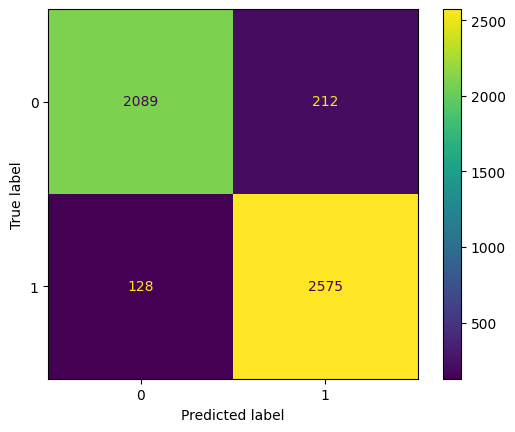

In [177]:
optimized_rfc_pred = optimized_rfc.predict(X_test)
print(metrics.classification_report(y_test,optimized_rfc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(optimized_rfc,X_test,y_test)

In [179]:
error_rates = []
misclassifications = []

for i in range(100,1001,100):
    rfc = RandomForestClassifier(n_estimators=i)
    rfc.fit(X_train,y_train)
    preds = rfc.predict(X_test)
    n_missed = np.sum(preds!=y_test)
    error = 1 - metrics.accuracy_score(y_test,preds)
    error_rates.append(error)
    misclassifications.append(n_missed)

Text(0.5, 1.0, 'Error Distribution for various values of no. of estimators')

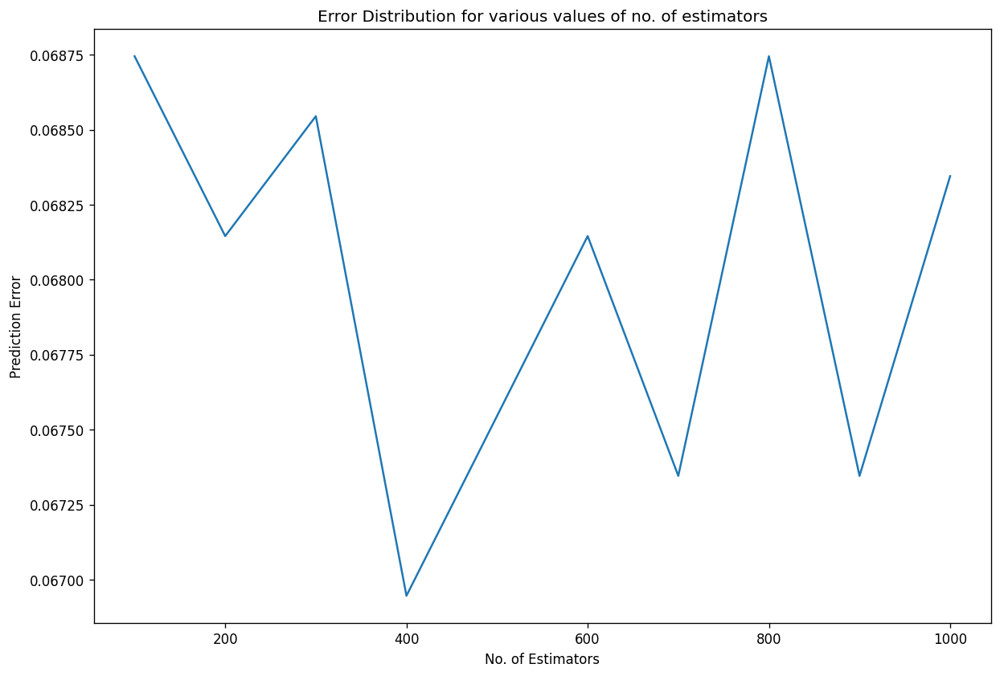

In [180]:
plt.figure(figsize=(12,8),dpi=120)
sns.lineplot(x = range(100,1001,100), y =error_rates)
plt.xlabel('No. of Estimators')
plt.ylabel('Prediction Error')
plt.title('Error Distribution for various values of no. of estimators')

Text(0.5, 1.0, 'Misclassifications for distinct no. of estimators')

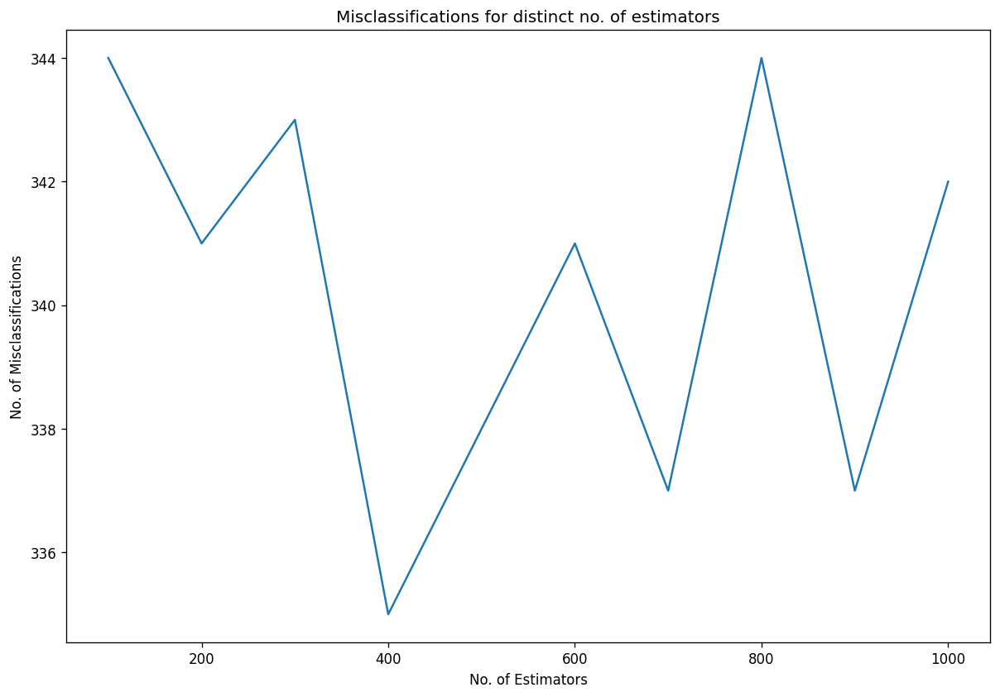

In [181]:
plt.figure(figsize=(12,8),dpi=120)
sns.lineplot(x = range(100,1001,100), y = misclassifications)
plt.xlabel('No. of Estimators')
plt.ylabel('No. of Misclassifications')
plt.title('Misclassifications for distinct no. of estimators')

We can clearly observe that the error rates and no. of misclassifications level off at about 900 estimators and don't reduce further down than that even after reaching 1000 estimators in total.. 

### For Adaptive Boosting Classifier

In [182]:
base_ada = AdaBoostClassifier(random_state=101)

In [183]:
param_grid = {'n_estimators': [100,400,700,1000],
              'learning_rate': [0.2,0.5,0.8,1],
              'algorithm': ['SAMME', 'SAMME.R']
             }

In [185]:
grid_ada = RandomizedSearchCV(base_ada,param_grid,verbose=4)
grid_ada.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END algorithm=SAMME.R, learning_rate=0.2, n_estimators=1000;, score=0.926 total time=  39.4s
[CV 2/5] END algorithm=SAMME.R, learning_rate=0.2, n_estimators=1000;, score=0.930 total time= 1.2min
[CV 3/5] END algorithm=SAMME.R, learning_rate=0.2, n_estimators=1000;, score=0.925 total time= 1.3min
[CV 4/5] END algorithm=SAMME.R, learning_rate=0.2, n_estimators=1000;, score=0.921 total time= 1.3min
[CV 5/5] END algorithm=SAMME.R, learning_rate=0.2, n_estimators=1000;, score=0.928 total time= 1.3min
[CV 1/5] END algorithm=SAMME.R, learning_rate=1, n_estimators=400;, score=0.930 total time=  32.8s
[CV 2/5] END algorithm=SAMME.R, learning_rate=1, n_estimators=400;, score=0.927 total time=  31.1s
[CV 3/5] END algorithm=SAMME.R, learning_rate=1, n_estimators=400;, score=0.927 total time=  31.0s
[CV 4/5] END algorithm=SAMME.R, learning_rate=1, n_estimators=400;, score=0.927 total time=  31.6s
[CV 5/5] END algorithm=SAMME.R, l

RandomizedSearchCV(estimator=AdaBoostClassifier(random_state=101),
                   param_distributions={'algorithm': ['SAMME', 'SAMME.R'],
                                        'learning_rate': [0.2, 0.5, 0.8, 1],
                                        'n_estimators': [100, 400, 700, 1000]},
                   verbose=4)

In [186]:
grid_ada.best_estimator_.get_params()

{'algorithm': 'SAMME.R',
 'base_estimator': 'deprecated',
 'estimator': None,
 'learning_rate': 1,
 'n_estimators': 400,
 'random_state': 101}

In [187]:
grid_ada.best_score_

0.9277703418207739

              precision    recall  f1-score   support

           0       0.96      0.89      0.92      2301
           1       0.91      0.97      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.94      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



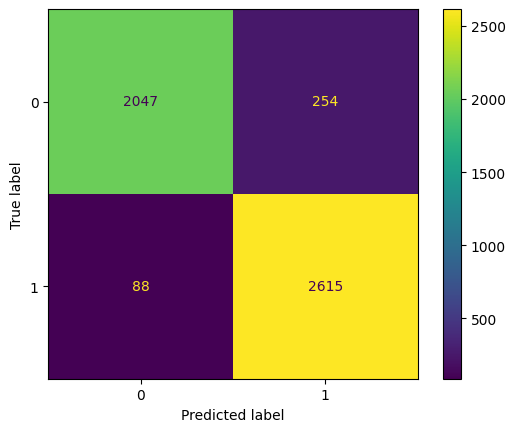

In [188]:
grid_ada_pred = grid_ada.predict(X_test)
print(metrics.classification_report(y_test,grid_ada_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_ada,X_test,y_test)

In [189]:
optimized_ada = AdaBoostClassifier(n_estimators=400,learning_rate=1,algorithm='SAMME.R',random_state=101)
optimized_ada.fit(X_train,y_train)

AdaBoostClassifier(learning_rate=1, n_estimators=400, random_state=101)

              precision    recall  f1-score   support

           0       0.96      0.89      0.92      2301
           1       0.91      0.97      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.94      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



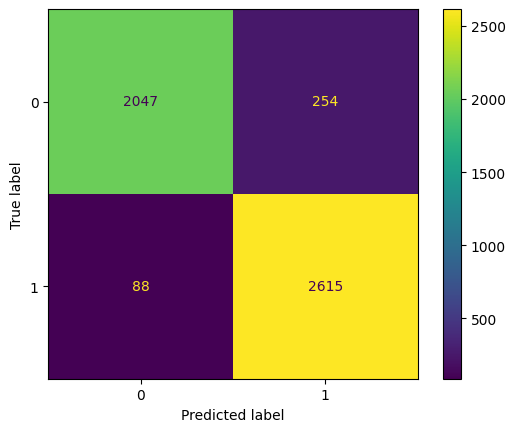

In [190]:
optimized_ada_pred = optimized_ada.predict(X_test)
print(metrics.classification_report(y_test,optimized_ada_pred))
metrics.ConfusionMatrixDisplay.from_estimator(optimized_ada,X_test,y_test)

### For Gradient Boosting Classifier

In [191]:
base_gbc = GradientBoostingClassifier(random_state=101)

In [192]:
param_grid = {'loss': ['deviance','exponential'],
              'n_estimators': [100,400,700,1000],
              'learning_rate': [0.2,0.4,0.7,1],
              'criterion': ['friedman_mse', 'mse'],
              'max_depth': [15,50,100,150],
              'max_features': ['auto','log2',None]
             }

In [193]:
grid_gbc = RandomizedSearchCV(base_gbc,param_grid,verbose=3,cv=2)
grid_gbc.fit(X_train,y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV 1/2] END criterion=friedman_mse, learning_rate=1, loss=deviance, max_depth=100, max_features=None, n_estimators=1000;, score=0.910 total time=  12.4s
[CV 2/2] END criterion=friedman_mse, learning_rate=1, loss=deviance, max_depth=100, max_features=None, n_estimators=1000;, score=0.913 total time=  12.0s
[CV 1/2] END criterion=friedman_mse, learning_rate=0.2, loss=exponential, max_depth=100, max_features=None, n_estimators=400;, score=0.909 total time=  27.9s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.2, loss=exponential, max_depth=100, max_features=None, n_estimators=400;, score=0.912 total time=  28.5s
[CV 1/2] END criterion=friedman_mse, learning_rate=0.7, loss=exponential, max_depth=15, max_features=log2, n_estimators=400;, score=0.928 total time=  13.0s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.7, loss=exponential, max_depth=15, max_features=log2, n_estimators=400;, score=0.924 total time=  12.3s
[

RandomizedSearchCV(cv=2, estimator=GradientBoostingClassifier(random_state=101),
                   param_distributions={'criterion': ['friedman_mse', 'mse'],
                                        'learning_rate': [0.2, 0.4, 0.7, 1],
                                        'loss': ['deviance', 'exponential'],
                                        'max_depth': [15, 50, 100, 150],
                                        'max_features': ['auto', 'log2', None],
                                        'n_estimators': [100, 400, 700, 1000]},
                   verbose=3)

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2301
           1       0.93      0.94      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



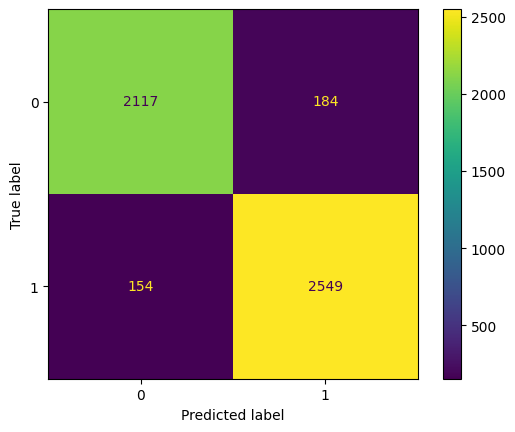

In [194]:
grid_gbc_pred = grid_gbc.predict(X_test)
print(metrics.classification_report(y_test,grid_gbc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_gbc,X_test,y_test)

In [195]:
optimized_gbc = GradientBoostingClassifier(n_estimators=1000,max_depth=8,loss='exponential',learning_rate=0.7,criterion='friedman_mse',random_state=101)
optimized_gbc.fit(X_train,y_train)

GradientBoostingClassifier(learning_rate=0.7, loss='exponential', max_depth=8,
                           n_estimators=1000, random_state=101)

              precision    recall  f1-score   support

           0       0.94      0.91      0.93      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



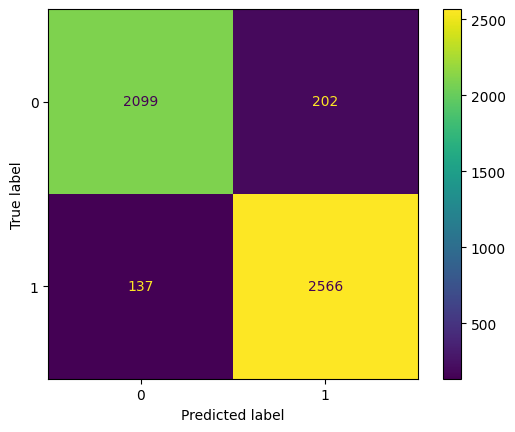

In [196]:
optimized_gbc_pred = optimized_gbc.predict(X_test)
print(metrics.classification_report(y_test,optimized_gbc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(optimized_gbc,X_test,y_test)

### For Histogram-based Gradient Boosting Classifier

In [197]:
base_hgbc = HistGradientBoostingClassifier(random_state=101,loss='binary_crossentropy',verbose=2)

In [198]:
param_grid = {'learning_rate': [0.2,0.5,0.8,1],
             'max_bins': [32,64,128,255],
             'warm_start': [True,False]
             }

In [199]:
grid_hgbc = RandomizedSearchCV(base_hgbc,param_grid,verbose=5,cv=RepeatedKFold(n_splits=8,n_repeats=2))
grid_hgbc.fit(X_train,y_train)

Fitting 16 folds for each of 10 candidates, totalling 160 fits
Binning 0.004 GB of training data: 0.077 s
Binning 0.000 GB of validation data: 0.003 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 7, train loss: 0.37972, val loss: 0.38365, in 0.097s
[2/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.26183, val loss: 0.26942, in 0.042s
[3/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.20491, val loss: 0.21523, in 0.042s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.17604, val loss: 0.18781, in 0.040s
[5/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15966, val loss: 0.17323, in 0.041s
[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14946, val loss: 0.16762, in 0.037s
[7/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.14343, val loss: 0.16492, in 0.039s
[8/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13879, val loss: 0.16360, in 0.040s
[9/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.13448, val loss: 0

RandomizedSearchCV(cv=RepeatedKFold(n_repeats=2, n_splits=8, random_state=None),
                   estimator=HistGradientBoostingClassifier(loss='binary_crossentropy',
                                                            random_state=101,
                                                            verbose=2),
                   param_distributions={'learning_rate': [0.2, 0.5, 0.8, 1],
                                        'max_bins': [32, 64, 128, 255],
                                        'warm_start': [True, False]},
                   verbose=5)

[25/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.13399, val loss: 0.16553, in 0.013s
[26/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13201, val loss: 0.16585, in 0.012s
[27/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13058, val loss: 0.16603, in 0.013s
[28/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12897, val loss: 0.16609, in 0.012s
[29/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.12764, val loss: 0.16604, in 0.011s
[30/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.12574, val loss: 0.16550, in 0.013s
[31/100] 1 tree, 31 leaves, max depth = 16, train loss: 0.12425, val loss: 0.16585, in 0.012s
[32/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.12310, val loss: 0.16598, in 0.012s
[33/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12174, val loss: 0.16642, in 0.012s
[34/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12044, val loss: 0.16668, in 0.012s
[35/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.119

[28/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.12610, val loss: 0.17092, in 0.012s
[29/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.12464, val loss: 0.17050, in 0.014s
[30/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12346, val loss: 0.17079, in 0.012s
[31/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12211, val loss: 0.17082, in 0.014s
[32/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12101, val loss: 0.17086, in 0.011s
[33/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.11933, val loss: 0.17122, in 0.012s
[34/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11793, val loss: 0.17154, in 0.012s
[35/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.11699, val loss: 0.17190, in 0.011s
[36/100] 1 tree, 31 leaves, max depth = 17, train loss: 0.11539, val loss: 0.17229, in 0.013s
[37/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.11419, val loss: 0.17176, in 0.011s
[38/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11

[31/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.12453, val loss: 0.13921, in 0.011s
[32/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12327, val loss: 0.13924, in 0.013s
[33/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12208, val loss: 0.13900, in 0.011s
[34/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12090, val loss: 0.13879, in 0.011s
[35/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.11953, val loss: 0.13892, in 0.012s
[36/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.11829, val loss: 0.13973, in 0.013s
[37/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.11720, val loss: 0.14019, in 0.011s
[38/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11620, val loss: 0.14006, in 0.010s
[39/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.11445, val loss: 0.13999, in 0.014s
[40/100] 1 tree, 31 leaves, max depth = 7, train loss: 0.11319, val loss: 0.14050, in 0.013s
[41/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.11218, 

[32/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12117, val loss: 0.15584, in 0.013s
[33/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12013, val loss: 0.15588, in 0.011s
[34/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11877, val loss: 0.15607, in 0.011s
[35/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.11684, val loss: 0.15646, in 0.012s
[36/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.11579, val loss: 0.15654, in 0.012s
Fit 36 trees in 0.523 s, (1116 total leaves)
Time spent computing histograms: 0.157s
Time spent finding best splits:  0.021s
Time spent applying splits:      0.045s
Time spent predicting:           0.003s
[CV 14/16] END learning_rate=0.2, max_bins=128, warm_start=False;, score=0.926 total time=   0.4s
Binning 0.004 GB of training data: 0.043 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.54322, val loss: 0.54520, in 0.013s
[2/100] 1 tree

Binning 0.004 GB of training data: 0.042 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.23390, val loss: 0.24202, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.16944, val loss: 0.18116, in 0.011s
[3/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.15359, val loss: 0.17367, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.14799, val loss: 0.18098, in 0.010s
[5/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.15959, val loss: 0.19494, in 0.011s
[6/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15619, val loss: 0.19227, in 0.009s
[7/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.17373, val loss: 0.21695, in 0.009s
[8/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.17406, val loss: 0.20620, in 0.008s
[9/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.50596, val loss: 0.74669, in 0.009s
[10/100] 1 tree, 31 leaves, max depth = 9, train

Binning 0.004 GB of training data: 0.041 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.23531, val loss: 0.23376, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.16970, val loss: 0.17848, in 0.012s
[3/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.15379, val loss: 0.17167, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.14733, val loss: 0.17349, in 0.010s
[5/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14196, val loss: 0.17524, in 0.011s
[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14300, val loss: 0.17967, in 0.010s
[7/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.15919, val loss: 0.18352, in 0.011s
[8/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.15575, val loss: 0.18951, in 0.010s
[9/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16481, val loss: 0.21397, in 0.011s
[10/100] 1 tree, 31 leaves, max depth = 10, t

Time spent predicting:           0.002s
[CV 2/16] END learning_rate=0.2, max_bins=32, warm_start=True;, score=0.919 total time=   0.3s
Binning 0.004 GB of training data: 0.044 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.54288, val loss: 0.54540, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.44474, val loss: 0.44931, in 0.010s
[3/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.37507, val loss: 0.38104, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.32378, val loss: 0.33131, in 0.010s
[5/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.28527, val loss: 0.29363, in 0.011s
[6/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.25574, val loss: 0.26533, in 0.011s
[7/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.23298, val loss: 0.24396, in 0.010s
[8/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.21542, val loss: 0.22760, in 0.011s
[9/100] 

Binning 0.004 GB of training data: 0.049 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.54302, val loss: 0.54485, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.44498, val loss: 0.44813, in 0.010s
[3/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.37542, val loss: 0.37929, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.32421, val loss: 0.32904, in 0.012s
[5/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.28567, val loss: 0.29096, in 0.010s
[6/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.25628, val loss: 0.26200, in 0.012s
[7/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.23370, val loss: 0.24010, in 0.014s
[8/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.21612, val loss: 0.22316, in 0.011s
[9/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.20229, val loss: 0.20996, in 0.011s
[10/100] 1 tree, 31 leaves, max depth = 8, train 

[CV 6/16] END learning_rate=0.2, max_bins=32, warm_start=True;, score=0.929 total time=   0.4s
Binning 0.004 GB of training data: 0.045 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.54240, val loss: 0.54352, in 0.010s
[2/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.44417, val loss: 0.44641, in 0.011s
[3/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.37436, val loss: 0.37767, in 0.010s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.32305, val loss: 0.32723, in 0.011s
[5/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.28459, val loss: 0.29007, in 0.011s
[6/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.25495, val loss: 0.26164, in 0.010s
[7/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.23208, val loss: 0.23979, in 0.011s
[8/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.21436, val loss: 0.22370, in 0.011s
[9/100] 1 tree, 31 leaves, max depth = 9, train

[10/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.19194, val loss: 0.18612, in 0.010s
[11/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.18370, val loss: 0.17781, in 0.010s
[12/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.17720, val loss: 0.17101, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.17196, val loss: 0.16616, in 0.010s
[14/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.16747, val loss: 0.16211, in 0.010s
[15/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.16329, val loss: 0.15839, in 0.010s
[16/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15960, val loss: 0.15623, in 0.010s
[17/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15676, val loss: 0.15418, in 0.010s
[18/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15398, val loss: 0.15262, in 0.010s
[19/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15150, val loss: 0.15140, in 0.009s
[20/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.1491

[10/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.18959, val loss: 0.19394, in 0.010s
[11/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.18117, val loss: 0.18570, in 0.010s
[12/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.17432, val loss: 0.17949, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16906, val loss: 0.17543, in 0.010s
[14/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.16447, val loss: 0.17147, in 0.010s
[15/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.16016, val loss: 0.16890, in 0.010s
[16/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15649, val loss: 0.16642, in 0.010s
[17/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.15366, val loss: 0.16495, in 0.010s
[18/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.15111, val loss: 0.16358, in 0.010s
[19/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14893, val loss: 0.16247, in 0.011s
[20/100] 1 tree, 31 leaves, max depth = 16, train loss: 0.14672,

[12/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.17585, val loss: 0.19846, in 0.010s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.17045, val loss: 0.19453, in 0.011s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16596, val loss: 0.19124, in 0.011s
[15/100] 1 tree, 31 leaves, max depth = 16, train loss: 0.16169, val loss: 0.18938, in 0.010s
[16/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15818, val loss: 0.18791, in 0.011s
[17/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15545, val loss: 0.18665, in 0.011s
[18/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15273, val loss: 0.18541, in 0.010s
[19/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15029, val loss: 0.18439, in 0.012s
[20/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14834, val loss: 0.18372, in 0.010s
[21/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.14665, val loss: 0.18344, in 0.010s
[22/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.14

[24/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.13912, val loss: 0.17820, in 0.010s
[25/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.13760, val loss: 0.17794, in 0.010s
[26/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13588, val loss: 0.17802, in 0.010s
[27/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13449, val loss: 0.17839, in 0.010s
[28/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13313, val loss: 0.17874, in 0.009s
[29/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13148, val loss: 0.17821, in 0.009s
[30/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13014, val loss: 0.17790, in 0.010s
[31/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.12837, val loss: 0.17797, in 0.009s
[32/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12725, val loss: 0.17784, in 0.009s
[33/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12573, val loss: 0.17757, in 0.009s
[34/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12

[16/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.11772, val loss: 0.16234, in 0.014s
[17/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.11584, val loss: 0.16361, in 0.012s
[18/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.11314, val loss: 0.16377, in 0.013s
Fit 18 trees in 0.306 s, (558 total leaves)
Time spent computing histograms: 0.085s
Time spent finding best splits:  0.013s
Time spent applying splits:      0.022s
Time spent predicting:           0.001s
[CV 1/16] END learning_rate=0.5, max_bins=255, warm_start=False;, score=0.928 total time=   0.2s
Binning 0.004 GB of training data: 0.043 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.37852, val loss: 0.37760, in 0.013s
[2/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.26597, val loss: 0.26441, in 0.015s
[3/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.20669, val loss: 0.20808, in 0.015s
[4/100] 1 tree, 31 le

[12/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12671, val loss: 0.17790, in 0.013s
[13/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12357, val loss: 0.17835, in 0.014s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12008, val loss: 0.17905, in 0.013s
[15/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.11714, val loss: 0.17826, in 0.013s
[16/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11496, val loss: 0.18129, in 0.013s
[17/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.11189, val loss: 0.18263, in 0.013s
Fit 17 trees in 0.299 s, (527 total leaves)
Time spent computing histograms: 0.084s
Time spent finding best splits:  0.013s
Time spent applying splits:      0.021s
Time spent predicting:           0.001s
[CV 5/16] END learning_rate=0.5, max_bins=255, warm_start=False;, score=0.929 total time=   0.2s
Binning 0.004 GB of training data: 0.044 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree,

[12/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12901, val loss: 0.14945, in 0.013s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12620, val loss: 0.14953, in 0.013s
[14/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.12312, val loss: 0.15170, in 0.013s
[15/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12038, val loss: 0.15146, in 0.012s
[16/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.11727, val loss: 0.15595, in 0.012s
[17/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.11470, val loss: 0.15994, in 0.011s
[18/100] 1 tree, 31 leaves, max depth = 17, train loss: 0.11178, val loss: 0.15947, in 0.012s
Fit 18 trees in 0.307 s, (558 total leaves)
Time spent computing histograms: 0.088s
Time spent finding best splits:  0.013s
Time spent applying splits:      0.022s
Time spent predicting:           0.001s
[CV 9/16] END learning_rate=0.5, max_bins=255, warm_start=False;, score=0.925 total time=   0.2s
Binning 0.004 GB of training data: 0.044 s

[7/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14692, val loss: 0.18043, in 0.014s
[8/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.14212, val loss: 0.17970, in 0.013s
[9/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13817, val loss: 0.18329, in 0.014s
[10/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.13451, val loss: 0.18583, in 0.013s
[11/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.13202, val loss: 0.19211, in 0.012s
[12/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12914, val loss: 0.18918, in 0.012s
[13/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12644, val loss: 0.19227, in 0.014s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12323, val loss: 0.19403, in 0.013s
[15/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.11994, val loss: 0.19778, in 0.012s
[16/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.11696, val loss: 0.20075, in 0.013s
[17/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.11386, 

[5/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15973, val loss: 0.19223, in 0.012s
[6/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.17184, val loss: 0.19327, in 0.011s
[7/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.22716, val loss: 0.27279, in 0.011s
[8/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.26074, val loss: 0.35927, in 0.012s
[9/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.52409, val loss: 0.54469, in 0.011s
[10/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.49211, val loss: 0.49114, in 0.010s
[11/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.55223, val loss: 0.57708, in 0.011s
[12/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.85752, val loss: 0.54514, in 0.010s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.82605, val loss: 0.56439, in 0.012s
Fit 13 trees in 0.220 s, (403 total leaves)
Time spent computing histograms: 0.047s
Time spent finding best splits:  0.007s
Time spent applying splits:      0.0

[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15648, val loss: 0.19995, in 0.011s
[7/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.15876, val loss: 0.21229, in 0.012s
[8/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.17204, val loss: 0.23808, in 0.011s
[9/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.17298, val loss: 0.24943, in 0.012s
[10/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.17464, val loss: 0.25686, in 0.011s
[11/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16907, val loss: 0.26530, in 0.012s
[12/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16854, val loss: 0.28231, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.24571, val loss: 0.29831, in 0.010s
Fit 13 trees in 0.220 s, (403 total leaves)
Time spent computing histograms: 0.049s
Time spent finding best splits:  0.007s
Time spent applying splits:      0.015s
Time spent predicting:           0.001s
[CV 6/16] END learning_rate=1, max_bins=128, warm

[6/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.14423, val loss: 0.18504, in 0.013s
[7/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14279, val loss: 0.19138, in 0.012s
[8/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15885, val loss: 0.22453, in 0.011s
[9/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16356, val loss: 0.22240, in 0.010s
[10/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.23325, val loss: 0.25075, in 0.011s
[11/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.24879, val loss: 0.25424, in 0.011s
[12/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.69534, val loss: 0.48789, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.89473, val loss: 0.66418, in 0.011s
Fit 13 trees in 0.225 s, (403 total leaves)
Time spent computing histograms: 0.048s
Time spent finding best splits:  0.007s
Time spent applying splits:      0.014s
Time spent predicting:           0.001s
[CV 11/16] END learning_rate=1, max_bins=128, warm

[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15114, val loss: 0.17273, in 0.011s
[7/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15541, val loss: 0.17583, in 0.010s
[8/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.20577, val loss: 0.23059, in 0.011s
[9/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.39881, val loss: 0.20866, in 0.011s
[10/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.45066, val loss: 0.21108, in 0.010s
[11/100] 1 tree, 31 leaves, max depth = 9, train loss: 1.82505, val loss: 1.14106, in 0.015s
[12/100] 1 tree, 31 leaves, max depth = 11, train loss: 1.79862, val loss: 1.15976, in 0.012s
[13/100] 1 tree, 31 leaves, max depth = 9, train loss: 1.24936, val loss: 0.76452, in 0.013s
[14/100] 1 tree, 31 leaves, max depth = 8, train loss: 1.15498, val loss: 0.78789, in 0.011s
Fit 14 trees in 0.230 s, (434 total leaves)
Time spent computing histograms: 0.051s
Time spent finding best splits:  0.007s
Time spent applying splits:      0.016s

[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15183, val loss: 0.15937, in 0.014s
[7/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.14489, val loss: 0.15417, in 0.015s
[8/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13986, val loss: 0.15365, in 0.013s
[9/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.13616, val loss: 0.15558, in 0.015s
[10/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13279, val loss: 0.15887, in 0.013s
[11/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12901, val loss: 0.16143, in 0.014s
[12/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.12551, val loss: 0.16669, in 0.013s
[13/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12203, val loss: 0.16733, in 0.014s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.11906, val loss: 0.16733, in 0.014s
[15/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11646, val loss: 0.16771, in 0.012s
[16/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.11323, 

[5/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.16380, val loss: 0.17648, in 0.015s
[6/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15386, val loss: 0.16888, in 0.014s
[7/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14674, val loss: 0.16399, in 0.014s
[8/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.14233, val loss: 0.16571, in 0.013s
[9/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13831, val loss: 0.16502, in 0.013s
[10/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.13492, val loss: 0.16689, in 0.013s
[11/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13141, val loss: 0.16669, in 0.014s
[12/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12846, val loss: 0.17031, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.12520, val loss: 0.17376, in 0.013s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12194, val loss: 0.17476, in 0.013s
[15/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.11921, 

[3/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.20962, val loss: 0.20024, in 0.015s
[4/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.18051, val loss: 0.17119, in 0.014s
[5/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.16444, val loss: 0.15563, in 0.015s
[6/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15497, val loss: 0.14832, in 0.013s
[7/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.14793, val loss: 0.14357, in 0.016s
[8/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.14317, val loss: 0.14272, in 0.014s
[9/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13934, val loss: 0.14403, in 0.014s
[10/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.13568, val loss: 0.14227, in 0.014s
[11/100] 1 tree, 31 leaves, max depth = 18, train loss: 0.13299, val loss: 0.14368, in 0.011s
[12/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13027, val loss: 0.14297, in 0.012s
[13/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12774, val

Binning 0.004 GB of training data: 0.052 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.38231, val loss: 0.38229, in 0.014s
[2/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.26440, val loss: 0.26553, in 0.015s
[3/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.20756, val loss: 0.20996, in 0.015s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.17796, val loss: 0.18211, in 0.015s
[5/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.16186, val loss: 0.16883, in 0.015s
[6/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15245, val loss: 0.16136, in 0.014s
[7/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.14570, val loss: 0.15787, in 0.015s
[8/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.14054, val loss: 0.15786, in 0.014s
[9/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13712, val loss: 0.16402, in 0.013s
[10/100] 1 tree, 31 leaves, max depth = 11, t

[CV 3/16] END learning_rate=0.5, max_bins=32, warm_start=True;, score=0.927 total time=   0.2s
Binning 0.004 GB of training data: 0.045 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.37996, val loss: 0.38195, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.26869, val loss: 0.27281, in 0.011s
[3/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.21273, val loss: 0.21689, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.18408, val loss: 0.18866, in 0.010s
[5/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.16907, val loss: 0.17541, in 0.011s
[6/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15889, val loss: 0.16725, in 0.010s
[7/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.15270, val loss: 0.16301, in 0.011s
[8/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.14832, val loss: 0.16295, in 0.010s
[9/100] 1 tree, 31 leaves, max depth = 15, t

[12/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13426, val loss: 0.16558, in 0.009s
[13/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.13121, val loss: 0.16651, in 0.009s
[14/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.12898, val loss: 0.16785, in 0.009s
[15/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.12607, val loss: 0.16941, in 0.009s
[16/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.12331, val loss: 0.16817, in 0.009s
[17/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12160, val loss: 0.16883, in 0.009s
[18/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.11920, val loss: 0.17225, in 0.008s
[19/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.11679, val loss: 0.17536, in 0.010s
Fit 19 trees in 0.261 s, (589 total leaves)
Time spent computing histograms: 0.049s
Time spent finding best splits:  0.008s
Time spent applying splits:      0.022s
Time spent predicting:           0.001s
[CV 11/16] END learning_rate=0.5, max_bins=32

[10/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13968, val loss: 0.19010, in 0.011s
[11/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.13599, val loss: 0.19172, in 0.011s
[12/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.13342, val loss: 0.19124, in 0.010s
[13/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13066, val loss: 0.19123, in 0.011s
[14/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12776, val loss: 0.19462, in 0.012s
[15/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.12526, val loss: 0.19811, in 0.009s
[16/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.12284, val loss: 0.20012, in 0.012s
[17/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.11991, val loss: 0.20304, in 0.014s
Fit 17 trees in 0.264 s, (527 total leaves)
Time spent computing histograms: 0.053s
Time spent finding best splits:  0.008s
Time spent applying splits:      0.023s
Time spent predicting:           0.001s
[CV 15/16] END learning_rate=0.5, max_bins=32

[CV 3/16] END learning_rate=0.8, max_bins=32, warm_start=False;, score=0.918 total time=   0.2s
Binning 0.004 GB of training data: 0.061 s
Binning 0.000 GB of validation data: 0.001 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.27615, val loss: 0.27891, in 0.014s
[2/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.19726, val loss: 0.20227, in 0.013s
[3/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.16862, val loss: 0.17449, in 0.011s
[4/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.15591, val loss: 0.16367, in 0.015s
[5/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15126, val loss: 0.16836, in 0.013s
[6/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.14602, val loss: 0.16622, in 0.012s
[7/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.14608, val loss: 0.17591, in 0.011s
[8/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.14235, val loss: 0.18119, in 0.012s
[9/100] 1 tree, 31 leaves, max depth = 13

[12/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.16326, val loss: 0.21772, in 0.011s
[13/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.15573, val loss: 0.20248, in 0.012s
[14/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.15412, val loss: 0.20368, in 0.013s
Fit 14 trees in 0.256 s, (434 total leaves)
Time spent computing histograms: 0.045s
Time spent finding best splits:  0.007s
Time spent applying splits:      0.019s
Time spent predicting:           0.001s
[CV 8/16] END learning_rate=0.8, max_bins=32, warm_start=False;, score=0.922 total time=   0.2s
Binning 0.004 GB of training data: 0.055 s
Binning 0.000 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.27647, val loss: 0.27189, in 0.011s
[2/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.19552, val loss: 0.19009, in 0.015s
[3/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.16872, val loss: 0.16472, in 0.012s
[4/100] 1 tree, 31 lea

[8/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15085, val loss: 0.22630, in 0.009s
[9/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.15797, val loss: 0.23033, in 0.010s
[10/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.15223, val loss: 0.22814, in 0.009s
[11/100] 1 tree, 31 leaves, max depth = 10, train loss: 0.18260, val loss: 0.25727, in 0.010s
[12/100] 1 tree, 31 leaves, max depth = 9, train loss: 0.18971, val loss: 0.29300, in 0.008s
[13/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.33643, val loss: 0.55856, in 0.010s
[14/100] 1 tree, 31 leaves, max depth = 8, train loss: 0.76516, val loss: 1.35547, in 0.010s
Fit 14 trees in 0.215 s, (434 total leaves)
Time spent computing histograms: 0.033s
Time spent finding best splits:  0.006s
Time spent applying splits:      0.015s
Time spent predicting:           0.001s
[CV 13/16] END learning_rate=0.8, max_bins=32, warm_start=False;, score=0.921 total time=   0.1s
Binning 0.004 GB of training data: 0.050 s
Bin

[21/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.14224, val loss: 0.14742, in 0.014s
[22/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.14054, val loss: 0.14682, in 0.015s
[23/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.13871, val loss: 0.14662, in 0.014s
[24/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13728, val loss: 0.14654, in 0.013s
[25/100] 1 tree, 31 leaves, max depth = 14, train loss: 0.13591, val loss: 0.14657, in 0.014s
[26/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.13439, val loss: 0.14650, in 0.014s
[27/100] 1 tree, 31 leaves, max depth = 11, train loss: 0.13306, val loss: 0.14760, in 0.014s
[28/100] 1 tree, 31 leaves, max depth = 15, train loss: 0.13159, val loss: 0.14837, in 0.013s
[29/100] 1 tree, 31 leaves, max depth = 12, train loss: 0.13022, val loss: 0.14867, in 0.015s
[30/100] 1 tree, 31 leaves, max depth = 13, train loss: 0.12890, val loss: 0.14887, in 0.014s
[31/100] 1 tree, 31 leaves, max depth = 18, train loss: 0.12

RandomizedSearchCV(cv=RepeatedKFold(n_repeats=2, n_splits=8, random_state=None),
                   estimator=HistGradientBoostingClassifier(loss='binary_crossentropy',
                                                            random_state=101,
                                                            verbose=2),
                   param_distributions={'learning_rate': [0.2, 0.5, 0.8, 1],
                                        'max_bins': [32, 64, 128, 255],
                                        'warm_start': [True, False]},
                   verbose=5)

In [200]:
grid_hgbc.best_estimator_.get_params()

{'categorical_features': None,
 'class_weight': None,
 'early_stopping': 'auto',
 'interaction_cst': None,
 'l2_regularization': 0.0,
 'learning_rate': 0.2,
 'loss': 'binary_crossentropy',
 'max_bins': 255,
 'max_depth': None,
 'max_iter': 100,
 'max_leaf_nodes': 31,
 'min_samples_leaf': 20,
 'monotonic_cst': None,
 'n_iter_no_change': 10,
 'random_state': 101,
 'scoring': 'loss',
 'tol': 1e-07,
 'validation_fraction': 0.1,
 'verbose': 2,
 'warm_start': True}

              precision    recall  f1-score   support

           0       0.93      0.92      0.92      2301
           1       0.93      0.95      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



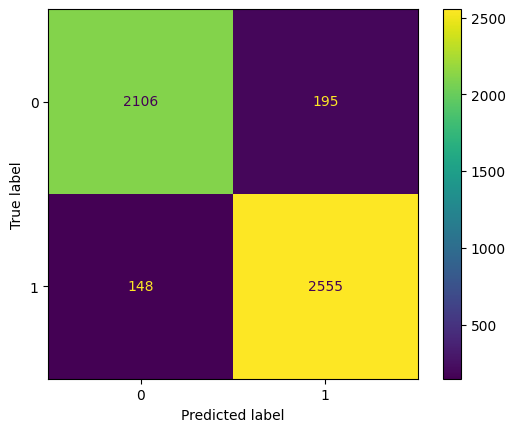

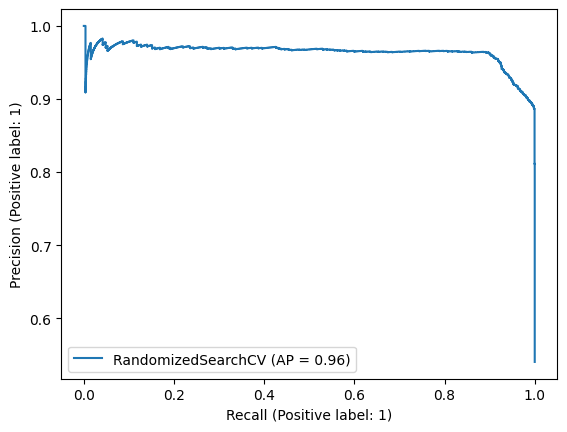

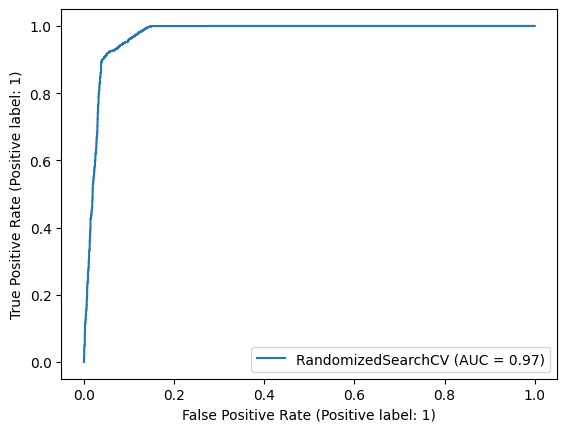

In [203]:
grid_hgbc_pred = grid_hgbc.predict(X_test)
print(metrics.classification_report(y_test,grid_hgbc_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_hgbc,X_test,y_test)
metrics.PrecisionRecallDisplay.from_estimator(grid_hgbc,X_test,y_test)
metrics.RocCurveDisplay.from_estimator(grid_hgbc,X_test,y_test)

### For CatBoost Classifier Model

In [204]:
base_cat = CatBoostClassifier(random_state=101,verbose=2)

In [205]:
param_grid = {'learning_rate': [0.2,0.4,0.7,1],
              'n_estimators': [200,500,1000],
             'loss_function': ['Logloss','CrossEntropy'],
             'feature_border_type': ['Median','Uniform','UniformAndQuantiles','GreedyLogSum','MaxLogSum','MinEntropy'],
             'od_type': ['IncToDec','Iter'],
             'nan_mode': ['Min','Max'],
             'leaf_estimation_method': ['Newton','Gradient'],
             'bootstrap_type': ['Bayesian','Bernoulli','Poisson','MVS'],
             'score_function': ['L2','Cosine','NewtonL2','NewtonCosine'],
             'boost_from_average': [True,False],
             'langevin': [True,False],
             'grow_policy': ['SymmetricTree','Lossguide','Depthwise'],
             'use_best_model': [True,False]
             }

In [206]:
grid_cat = RandomizedSearchCV(base_cat,param_grid,verbose=5,cv=4, refit=True)
grid_cat.fit(X_train,y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV 1/4] END boost_from_average=False, bootstrap_type=MVS, feature_border_type=GreedyLogSum, grow_policy=SymmetricTree, langevin=True, leaf_estimation_method=Gradient, learning_rate=0.4, loss_function=CrossEntropy, n_estimators=1000, nan_mode=Max, od_type=IncToDec, score_function=NewtonCosine, use_best_model=False;, score=nan total time=   0.1s
[CV 2/4] END boost_from_average=False, bootstrap_type=MVS, feature_border_type=GreedyLogSum, grow_policy=SymmetricTree, langevin=True, leaf_estimation_method=Gradient, learning_rate=0.4, loss_function=CrossEntropy, n_estimators=1000, nan_mode=Max, od_type=IncToDec, score_function=NewtonCosine, use_best_model=False;, score=nan total time=   0.0s
[CV 3/4] END boost_from_average=False, bootstrap_type=MVS, feature_border_type=GreedyLogSum, grow_policy=SymmetricTree, langevin=True, leaf_estimation_method=Gradient, learning_rate=0.4, loss_function=CrossEntropy, n_estimators=1000, nan_mode=Ma

RandomizedSearchCV(cv=4,
                   estimator=<catboost.core.CatBoostClassifier object at 0x0000018194CE4C10>,
                   param_distributions={'boost_from_average': [True, False],
                                        'bootstrap_type': ['Bayesian',
                                                           'Bernoulli',
                                                           'Poisson', 'MVS'],
                                        'feature_border_type': ['Median',
                                                                'Uniform',
                                                                'UniformAndQuantiles',
                                                                'GreedyLogSum',
                                                                'MaxLogSum',
                                                                'MinEntropy'],
                                        'grow_policy': ['SymmetricTree',
                                                        'Lossguide',
                                                        'Depthwise'],
                                        'langevin': [True, False],
                                        'leaf_estimation_method': ['Newton',
                                                                   'Gradient'],
                                        'learning_rate': [0.2, 0.4, 0.7, 1],
                                        'loss_function': ['Logloss',
                                                          'CrossEntropy'],
                                        'n_estimators': [200, 500, 1000],
                                        'nan_mode': ['Min', 'Max'],
                                        'od_type': ['IncToDec', 'Iter'],
                                        'score_function': ['L2', 'Cosine',
                                                           'NewtonL2',
                                                           'NewtonCosine'],
                                        'use_best_model': [True, False]},
                   verbose=5)

80:	learn: 0.0138397	total: 2.85s	remaining: 32.4s
82:	learn: 0.0133168	total: 2.95s	remaining: 32.6s
84:	learn: 0.0126562	total: 3.02s	remaining: 32.5s
86:	learn: 0.0119736	total: 3.1s	remaining: 32.5s
88:	learn: 0.0114494	total: 3.17s	remaining: 32.4s
90:	learn: 0.0109772	total: 3.25s	remaining: 32.5s
92:	learn: 0.0106619	total: 3.33s	remaining: 32.4s
94:	learn: 0.0101287	total: 3.41s	remaining: 32.5s
96:	learn: 0.0098465	total: 3.49s	remaining: 32.5s
98:	learn: 0.0094528	total: 3.56s	remaining: 32.4s
100:	learn: 0.0092095	total: 3.62s	remaining: 32.3s
102:	learn: 0.0088899	total: 3.69s	remaining: 32.1s
104:	learn: 0.0085965	total: 3.77s	remaining: 32.1s
106:	learn: 0.0084278	total: 3.85s	remaining: 32.1s
108:	learn: 0.0082255	total: 3.91s	remaining: 32s
110:	learn: 0.0079657	total: 3.98s	remaining: 31.9s
112:	learn: 0.0077339	total: 4.04s	remaining: 31.7s
114:	learn: 0.0075034	total: 4.11s	remaining: 31.7s
116:	learn: 0.0073232	total: 4.19s	remaining: 31.6s
118:	learn: 0.0071126	tot

406:	learn: 0.0022547	total: 13.3s	remaining: 19.4s
408:	learn: 0.0022538	total: 13.4s	remaining: 19.3s
410:	learn: 0.0022513	total: 13.4s	remaining: 19.2s
412:	learn: 0.0022492	total: 13.5s	remaining: 19.2s
414:	learn: 0.0022460	total: 13.5s	remaining: 19.1s
416:	learn: 0.0022453	total: 13.6s	remaining: 19s
418:	learn: 0.0022445	total: 13.6s	remaining: 18.9s
420:	learn: 0.0022385	total: 13.7s	remaining: 18.8s
422:	learn: 0.0022371	total: 13.7s	remaining: 18.8s
424:	learn: 0.0022353	total: 13.8s	remaining: 18.7s
426:	learn: 0.0022321	total: 13.8s	remaining: 18.6s
428:	learn: 0.0022313	total: 13.9s	remaining: 18.5s
430:	learn: 0.0022223	total: 14s	remaining: 18.4s
432:	learn: 0.0022174	total: 14s	remaining: 18.4s
434:	learn: 0.0022143	total: 14.1s	remaining: 18.3s
436:	learn: 0.0022102	total: 14.1s	remaining: 18.2s
438:	learn: 0.0022093	total: 14.2s	remaining: 18.1s
440:	learn: 0.0022088	total: 14.2s	remaining: 18s
442:	learn: 0.0022047	total: 14.3s	remaining: 17.9s
444:	learn: 0.002202

732:	learn: 0.0017849	total: 21.8s	remaining: 7.96s
734:	learn: 0.0017841	total: 21.9s	remaining: 7.89s
736:	learn: 0.0017820	total: 21.9s	remaining: 7.83s
738:	learn: 0.0017789	total: 22s	remaining: 7.77s
740:	learn: 0.0017787	total: 22s	remaining: 7.7s
742:	learn: 0.0017761	total: 22.1s	remaining: 7.64s
744:	learn: 0.0017739	total: 22.1s	remaining: 7.58s
746:	learn: 0.0017722	total: 22.2s	remaining: 7.52s
748:	learn: 0.0017719	total: 22.2s	remaining: 7.45s
750:	learn: 0.0017663	total: 22.3s	remaining: 7.39s
752:	learn: 0.0017632	total: 22.3s	remaining: 7.33s
754:	learn: 0.0017630	total: 22.4s	remaining: 7.26s
756:	learn: 0.0017618	total: 22.4s	remaining: 7.2s
758:	learn: 0.0017604	total: 22.5s	remaining: 7.13s
760:	learn: 0.0017590	total: 22.5s	remaining: 7.07s
762:	learn: 0.0017546	total: 22.6s	remaining: 7.01s
764:	learn: 0.0017517	total: 22.6s	remaining: 6.94s
766:	learn: 0.0017501	total: 22.6s	remaining: 6.88s
768:	learn: 0.0017477	total: 22.7s	remaining: 6.82s
770:	learn: 0.0017

40:	learn: 0.0476565	total: 1.34s	remaining: 31.3s
42:	learn: 0.0441124	total: 1.4s	remaining: 31.1s
44:	learn: 0.0402202	total: 1.46s	remaining: 31s
46:	learn: 0.0377498	total: 1.53s	remaining: 31s
48:	learn: 0.0351655	total: 1.6s	remaining: 31.1s
50:	learn: 0.0334204	total: 1.66s	remaining: 31s
52:	learn: 0.0310443	total: 1.73s	remaining: 30.9s
54:	learn: 0.0289594	total: 1.79s	remaining: 30.8s
56:	learn: 0.0268120	total: 1.86s	remaining: 30.7s
58:	learn: 0.0250041	total: 1.92s	remaining: 30.7s
60:	learn: 0.0236456	total: 1.99s	remaining: 30.6s
62:	learn: 0.0224059	total: 2.05s	remaining: 30.5s
64:	learn: 0.0210411	total: 2.11s	remaining: 30.4s
66:	learn: 0.0196410	total: 2.18s	remaining: 30.3s
68:	learn: 0.0188591	total: 2.24s	remaining: 30.2s
70:	learn: 0.0176863	total: 2.3s	remaining: 30.1s
72:	learn: 0.0166476	total: 2.36s	remaining: 30s
74:	learn: 0.0158135	total: 2.42s	remaining: 29.9s
76:	learn: 0.0151281	total: 2.5s	remaining: 29.9s
78:	learn: 0.0144657	total: 2.56s	remaining

366:	learn: 0.0024402	total: 11.1s	remaining: 19.1s
368:	learn: 0.0024300	total: 11.1s	remaining: 19s
370:	learn: 0.0024286	total: 11.2s	remaining: 18.9s
372:	learn: 0.0024270	total: 11.2s	remaining: 18.9s
374:	learn: 0.0024189	total: 11.3s	remaining: 18.8s
376:	learn: 0.0024109	total: 11.3s	remaining: 18.7s
378:	learn: 0.0024089	total: 11.4s	remaining: 18.7s
380:	learn: 0.0023906	total: 11.4s	remaining: 18.6s
382:	learn: 0.0023743	total: 11.5s	remaining: 18.5s
384:	learn: 0.0023710	total: 11.6s	remaining: 18.5s
386:	learn: 0.0023705	total: 11.6s	remaining: 18.4s
388:	learn: 0.0023662	total: 11.7s	remaining: 18.3s
390:	learn: 0.0023653	total: 11.7s	remaining: 18.2s
392:	learn: 0.0023634	total: 11.8s	remaining: 18.1s
394:	learn: 0.0023630	total: 11.8s	remaining: 18.1s
396:	learn: 0.0023608	total: 11.8s	remaining: 18s
398:	learn: 0.0023587	total: 11.9s	remaining: 17.9s
400:	learn: 0.0023554	total: 11.9s	remaining: 17.8s
402:	learn: 0.0023461	total: 12s	remaining: 17.8s
404:	learn: 0.0023

688:	learn: 0.0018980	total: 18.6s	remaining: 8.37s
690:	learn: 0.0018958	total: 18.6s	remaining: 8.32s
692:	learn: 0.0018920	total: 18.7s	remaining: 8.26s
694:	learn: 0.0018910	total: 18.7s	remaining: 8.21s
696:	learn: 0.0018896	total: 18.7s	remaining: 8.15s
698:	learn: 0.0018877	total: 18.8s	remaining: 8.1s
700:	learn: 0.0018831	total: 18.9s	remaining: 8.04s
702:	learn: 0.0018812	total: 18.9s	remaining: 7.99s
704:	learn: 0.0018805	total: 18.9s	remaining: 7.93s
706:	learn: 0.0018792	total: 19s	remaining: 7.87s
708:	learn: 0.0018774	total: 19s	remaining: 7.82s
710:	learn: 0.0018752	total: 19.1s	remaining: 7.76s
712:	learn: 0.0018676	total: 19.1s	remaining: 7.71s
714:	learn: 0.0018598	total: 19.2s	remaining: 7.65s
716:	learn: 0.0018574	total: 19.3s	remaining: 7.6s
718:	learn: 0.0018552	total: 19.3s	remaining: 7.55s
720:	learn: 0.0018511	total: 19.4s	remaining: 7.49s
722:	learn: 0.0018487	total: 19.4s	remaining: 7.44s
724:	learn: 0.0018476	total: 19.5s	remaining: 7.39s
726:	learn: 0.0018

6:	learn: 0.1394819	total: 219ms	remaining: 31s
8:	learn: 0.1346731	total: 279ms	remaining: 30.7s
10:	learn: 0.1276079	total: 345ms	remaining: 31s
12:	learn: 0.1211642	total: 417ms	remaining: 31.7s
14:	learn: 0.1115040	total: 492ms	remaining: 32.3s
16:	learn: 0.1040043	total: 562ms	remaining: 32.5s
18:	learn: 0.0973104	total: 633ms	remaining: 32.7s
20:	learn: 0.0915436	total: 699ms	remaining: 32.6s
22:	learn: 0.0856658	total: 766ms	remaining: 32.5s
24:	learn: 0.0806049	total: 827ms	remaining: 32.2s
26:	learn: 0.0748439	total: 886ms	remaining: 31.9s
28:	learn: 0.0709363	total: 945ms	remaining: 31.7s
30:	learn: 0.0652156	total: 1.01s	remaining: 31.6s
32:	learn: 0.0618379	total: 1.08s	remaining: 31.6s
34:	learn: 0.0586152	total: 1.14s	remaining: 31.6s
36:	learn: 0.0545328	total: 1.22s	remaining: 31.7s
38:	learn: 0.0509249	total: 1.29s	remaining: 31.8s
40:	learn: 0.0477235	total: 1.36s	remaining: 31.8s
42:	learn: 0.0442521	total: 1.43s	remaining: 31.7s
44:	learn: 0.0414639	total: 1.49s	rem

326:	learn: 0.0026005	total: 10.7s	remaining: 21.9s
328:	learn: 0.0025912	total: 10.7s	remaining: 21.9s
330:	learn: 0.0025845	total: 10.8s	remaining: 21.8s
332:	learn: 0.0025738	total: 10.8s	remaining: 21.7s
334:	learn: 0.0025570	total: 10.9s	remaining: 21.6s
336:	learn: 0.0025382	total: 10.9s	remaining: 21.5s
338:	learn: 0.0025302	total: 11s	remaining: 21.4s
340:	learn: 0.0025173	total: 11s	remaining: 21.3s
342:	learn: 0.0025083	total: 11.1s	remaining: 21.3s
344:	learn: 0.0025071	total: 11.1s	remaining: 21.1s
346:	learn: 0.0024828	total: 11.2s	remaining: 21.1s
348:	learn: 0.0024771	total: 11.2s	remaining: 21s
350:	learn: 0.0024681	total: 11.3s	remaining: 20.9s
352:	learn: 0.0024572	total: 11.3s	remaining: 20.8s
354:	learn: 0.0024372	total: 11.4s	remaining: 20.7s
356:	learn: 0.0024360	total: 11.5s	remaining: 20.6s
358:	learn: 0.0024219	total: 11.5s	remaining: 20.6s
360:	learn: 0.0024163	total: 11.6s	remaining: 20.5s
362:	learn: 0.0024100	total: 11.6s	remaining: 20.4s
364:	learn: 0.0024

644:	learn: 0.0018961	total: 18.4s	remaining: 10.1s
646:	learn: 0.0018950	total: 18.5s	remaining: 10.1s
648:	learn: 0.0018943	total: 18.5s	remaining: 10s
650:	learn: 0.0018921	total: 18.6s	remaining: 9.96s
652:	learn: 0.0018915	total: 18.6s	remaining: 9.9s
654:	learn: 0.0018856	total: 18.7s	remaining: 9.84s
656:	learn: 0.0018831	total: 18.7s	remaining: 9.78s
658:	learn: 0.0018802	total: 18.8s	remaining: 9.72s
660:	learn: 0.0018778	total: 18.8s	remaining: 9.65s
662:	learn: 0.0018737	total: 18.9s	remaining: 9.59s
664:	learn: 0.0018736	total: 18.9s	remaining: 9.53s
666:	learn: 0.0018734	total: 19s	remaining: 9.46s
668:	learn: 0.0018662	total: 19s	remaining: 9.4s
670:	learn: 0.0018606	total: 19.1s	remaining: 9.34s
672:	learn: 0.0018565	total: 19.1s	remaining: 9.28s
674:	learn: 0.0018546	total: 19.2s	remaining: 9.22s
676:	learn: 0.0018543	total: 19.2s	remaining: 9.16s
678:	learn: 0.0018533	total: 19.2s	remaining: 9.1s
680:	learn: 0.0018524	total: 19.3s	remaining: 9.03s
682:	learn: 0.0018502

962:	learn: 0.0016456	total: 26.2s	remaining: 1.01s
964:	learn: 0.0016445	total: 26.2s	remaining: 951ms
966:	learn: 0.0016430	total: 26.3s	remaining: 897ms
968:	learn: 0.0016427	total: 26.3s	remaining: 842ms
970:	learn: 0.0016411	total: 26.4s	remaining: 787ms
972:	learn: 0.0016399	total: 26.4s	remaining: 733ms
974:	learn: 0.0016392	total: 26.5s	remaining: 678ms
976:	learn: 0.0016374	total: 26.5s	remaining: 624ms
978:	learn: 0.0016370	total: 26.5s	remaining: 569ms
980:	learn: 0.0016358	total: 26.6s	remaining: 515ms
982:	learn: 0.0016355	total: 26.6s	remaining: 461ms
984:	learn: 0.0016330	total: 26.7s	remaining: 406ms
986:	learn: 0.0016321	total: 26.7s	remaining: 352ms
988:	learn: 0.0016316	total: 26.8s	remaining: 298ms
990:	learn: 0.0016314	total: 26.8s	remaining: 244ms
992:	learn: 0.0016295	total: 26.9s	remaining: 189ms
994:	learn: 0.0016293	total: 26.9s	remaining: 135ms
996:	learn: 0.0016291	total: 26.9s	remaining: 81.1ms
998:	learn: 0.0016288	total: 27s	remaining: 27ms
999:	learn: 0.

162:	learn: 0.0724143	total: 2.58s	remaining: 586ms
164:	learn: 0.0719783	total: 2.61s	remaining: 554ms
166:	learn: 0.0714076	total: 2.64s	remaining: 522ms
168:	learn: 0.0707654	total: 2.67s	remaining: 490ms
170:	learn: 0.0701339	total: 2.7s	remaining: 459ms
172:	learn: 0.0696104	total: 2.74s	remaining: 427ms
174:	learn: 0.0691743	total: 2.77s	remaining: 395ms
176:	learn: 0.0687050	total: 2.8s	remaining: 363ms
178:	learn: 0.0680954	total: 2.83s	remaining: 332ms
180:	learn: 0.0676891	total: 2.86s	remaining: 300ms
182:	learn: 0.0669644	total: 2.89s	remaining: 268ms
184:	learn: 0.0664348	total: 2.92s	remaining: 237ms
186:	learn: 0.0657317	total: 2.95s	remaining: 205ms
188:	learn: 0.0653630	total: 2.98s	remaining: 173ms
190:	learn: 0.0646529	total: 3.01s	remaining: 142ms
192:	learn: 0.0642482	total: 3.04s	remaining: 110ms
194:	learn: 0.0636023	total: 3.07s	remaining: 78.7ms
196:	learn: 0.0631377	total: 3.1s	remaining: 47.2ms
198:	learn: 0.0628211	total: 3.13s	remaining: 15.7ms
199:	learn: 

RandomizedSearchCV(cv=4,
                   estimator=<catboost.core.CatBoostClassifier object at 0x0000022EA344FFD0>,
                   param_distributions={'boost_from_average': [True, False],
                                        'bootstrap_type': ['Bayesian',
                                                           'Bernoulli',
                                                           'Poisson', 'MVS'],
                                        'feature_border_type': ['Median',
                                                                'Uniform',
                                                                'UniformAndQuantiles',
                                                                'GreedyLogSum',
                                                                'MaxLogSum',
                                                                'MinEntropy'],
                                        'grow_policy': ['SymmetricTree',
                                      

In [207]:
grid_cat.best_estimator_.get_all_params()

{'nan_mode': 'Max',
 'eval_metric': 'CrossEntropy',
 'iterations': 500,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'od_pval': 0,
 'random_score_type': 'NormalWithModelSizeDecrease',
 'grow_policy': 'Lossguide',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'Median',
 'bayesian_matrix_reg': 0.10000000149011612,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'od_type': 'Iter',
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'pool_metainfo_options': {'tags': {}},
 'subsample': 0.800000011920929,
 'use_best_model': False,
 'od_wait': 20,
 'random_seed': 101,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_

              precision    recall  f1-score   support

           0       0.94      0.90      0.92      2301
           1       0.92      0.95      0.93      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



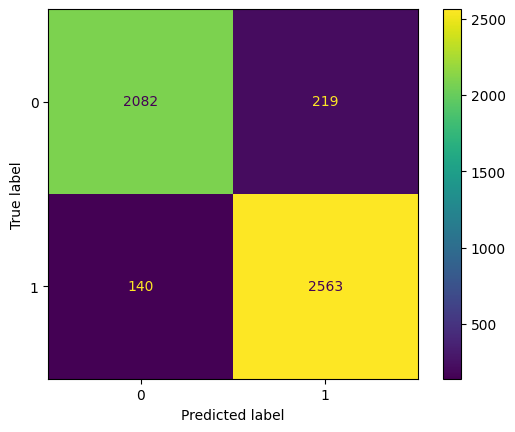

In [208]:
grid_cat_pred = grid_cat.predict(X_test)
print(metrics.classification_report(y_test,grid_cat_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_cat,X_test,y_test)

### For Bagging Classifier

In [209]:
base_bag = BaggingClassifier(random_state=101,verbose=2,oob_score=True)

In [210]:
param_grid = {'n_estimators': [200,500,800,1000],
              'max_samples': [0.24,0.58,0.71,0.96],
              'max_features': np.linspace(0,1,5),
              'bootstrap': [True,False],
              'warm_start': [True,False]
             }

In [211]:
grid_bag = RandomizedSearchCV(base_bag,param_grid,verbose=4)
grid_bag.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=nan total time=   0.0s
[CV 1/5] END bootstrap=False, max_features=1.0, max_samples=0.96, n_estimators=800, warm_start=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, max_features=1.0, max_samples=0.96, n_estimators=800, warm_start=False;, score=nan total time=   0.0s
[CV 3/5] E

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 1000)...
Building estimator 14 of 1000 for this parallel run (total 1000)...
Building estimator 15 of 1000 for this parallel run (total 1000)...
Building estimator 16 of 1000 for this parallel run (tot

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.1min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 1/5] END bootstrap=True, max_features=1.0, max_samples=0.96, n_estimators=1000, warm_start=False;, score=0.928 total time= 6.3min
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.2min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 2/5] END bootstrap=True, max_features=1.0, max_samples=0.96, n_estimators=1000, warm_start=False;, score=0.932 total time= 6.4min
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.5min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 3/5] END bootstrap=True, max_features=1.0, max_samples=0.96, n_estimators=1000, warm_start=False;, score=0.929 total time= 6.7min
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.4min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 4/5] END bootstrap=True, max_features=1.0, max_samples=0.96, n_estimators=1000, warm_start=False;, score=0.931 total time= 6.7min
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.5min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  6.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.3s finished


[CV 5/5] END bootstrap=True, max_features=1.0, max_samples=0.96, n_estimators=1000, warm_start=False;, score=0.929 total time= 6.8min
[CV 1/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=800, warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=800, warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=800, warm_start=True;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=800, warm_start=True;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, max_features=0.0, max_samples=0.71, n_estimators=800, warm_start=True;, score=nan total time=   0.0s
[CV 1/5] END bootstrap=True, max_features=0.25, max_samples=0.71, n_estimators=200, warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=True, max_features=0.25, max_samples=0.71, n_estimators=2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 1000)...
Building estimator 14 of 1000 for this parallel run (total 1000)...
Building estimator 15 of 1000 for this parallel run (tota

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  8.9min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  8.9min finished


RandomizedSearchCV(estimator=BaggingClassifier(oob_score=True, random_state=101,
                                               verbose=2),
                   param_distributions={'bootstrap': [True, False],
                                        'max_features': array([0.  , 0.25, 0.5 , 0.75, 1.  ]),
                                        'max_samples': [0.24, 0.58, 0.71, 0.96],
                                        'n_estimators': [200, 500, 800, 1000],
                                        'warm_start': [True, False]},
                   verbose=4)

[CV 4/5] END bootstrap=True, max_features=1.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=0.932 total time= 1.9min
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Building estimator 4 of 1000 for this parallel run (total 1000)...
Building estimator 5 of 1000 for this parallel run (total 1000)...
Building estimator 6 of 1000 for this parallel run (total 1000)...
Building estimator 7 of 1000 for this parallel run (total 1000)...
Building estimator 8 of 1000 for this parallel run (total 1000)...
Building estimator 9 of 1000 for this parallel run (total 1000)...
Building estimator 10 of 1000 for this parallel run (total 1000)...
Building estimator 11 of 1000 for this parallel run (total 1000)...
Building estimator 12 of 1000 for this parallel run (total 1000)...
Building estimator 13 of 1000 for this parallel run (total 

Building estimator 120 of 1000 for this parallel run (total 1000)...
Building estimator 121 of 1000 for this parallel run (total 1000)...
Building estimator 122 of 1000 for this parallel run (total 1000)...
Building estimator 123 of 1000 for this parallel run (total 1000)...
Building estimator 124 of 1000 for this parallel run (total 1000)...
Building estimator 125 of 1000 for this parallel run (total 1000)...
Building estimator 126 of 1000 for this parallel run (total 1000)...
Building estimator 127 of 1000 for this parallel run (total 1000)...
Building estimator 128 of 1000 for this parallel run (total 1000)...
Building estimator 129 of 1000 for this parallel run (total 1000)...
Building estimator 130 of 1000 for this parallel run (total 1000)...
Building estimator 131 of 1000 for this parallel run (total 1000)...
Building estimator 132 of 1000 for this parallel run (total 1000)...
Building estimator 133 of 1000 for this parallel run (total 1000)...
Building estimator 134 of 1000 for

Building estimator 241 of 1000 for this parallel run (total 1000)...
Building estimator 242 of 1000 for this parallel run (total 1000)...
Building estimator 243 of 1000 for this parallel run (total 1000)...
Building estimator 244 of 1000 for this parallel run (total 1000)...
Building estimator 245 of 1000 for this parallel run (total 1000)...
Building estimator 246 of 1000 for this parallel run (total 1000)...
Building estimator 247 of 1000 for this parallel run (total 1000)...
Building estimator 248 of 1000 for this parallel run (total 1000)...
Building estimator 249 of 1000 for this parallel run (total 1000)...
Building estimator 250 of 1000 for this parallel run (total 1000)...
Building estimator 251 of 1000 for this parallel run (total 1000)...
Building estimator 252 of 1000 for this parallel run (total 1000)...
Building estimator 253 of 1000 for this parallel run (total 1000)...
Building estimator 254 of 1000 for this parallel run (total 1000)...
Building estimator 255 of 1000 for

Building estimator 361 of 1000 for this parallel run (total 1000)...
Building estimator 362 of 1000 for this parallel run (total 1000)...
Building estimator 363 of 1000 for this parallel run (total 1000)...
Building estimator 364 of 1000 for this parallel run (total 1000)...
Building estimator 365 of 1000 for this parallel run (total 1000)...
Building estimator 366 of 1000 for this parallel run (total 1000)...
Building estimator 367 of 1000 for this parallel run (total 1000)...
Building estimator 368 of 1000 for this parallel run (total 1000)...
Building estimator 369 of 1000 for this parallel run (total 1000)...
Building estimator 370 of 1000 for this parallel run (total 1000)...
Building estimator 371 of 1000 for this parallel run (total 1000)...
Building estimator 372 of 1000 for this parallel run (total 1000)...
Building estimator 373 of 1000 for this parallel run (total 1000)...
Building estimator 374 of 1000 for this parallel run (total 1000)...
Building estimator 375 of 1000 for

Building estimator 481 of 1000 for this parallel run (total 1000)...
Building estimator 482 of 1000 for this parallel run (total 1000)...
Building estimator 483 of 1000 for this parallel run (total 1000)...
Building estimator 484 of 1000 for this parallel run (total 1000)...
Building estimator 485 of 1000 for this parallel run (total 1000)...
Building estimator 486 of 1000 for this parallel run (total 1000)...
Building estimator 487 of 1000 for this parallel run (total 1000)...
Building estimator 488 of 1000 for this parallel run (total 1000)...
Building estimator 489 of 1000 for this parallel run (total 1000)...
Building estimator 490 of 1000 for this parallel run (total 1000)...
Building estimator 491 of 1000 for this parallel run (total 1000)...
Building estimator 492 of 1000 for this parallel run (total 1000)...
Building estimator 493 of 1000 for this parallel run (total 1000)...
Building estimator 494 of 1000 for this parallel run (total 1000)...
Building estimator 495 of 1000 for

Building estimator 600 of 1000 for this parallel run (total 1000)...
Building estimator 601 of 1000 for this parallel run (total 1000)...
Building estimator 602 of 1000 for this parallel run (total 1000)...
Building estimator 603 of 1000 for this parallel run (total 1000)...
Building estimator 604 of 1000 for this parallel run (total 1000)...
Building estimator 605 of 1000 for this parallel run (total 1000)...
Building estimator 606 of 1000 for this parallel run (total 1000)...
Building estimator 607 of 1000 for this parallel run (total 1000)...
Building estimator 608 of 1000 for this parallel run (total 1000)...
Building estimator 609 of 1000 for this parallel run (total 1000)...
Building estimator 610 of 1000 for this parallel run (total 1000)...
Building estimator 611 of 1000 for this parallel run (total 1000)...
Building estimator 612 of 1000 for this parallel run (total 1000)...
Building estimator 613 of 1000 for this parallel run (total 1000)...
Building estimator 614 of 1000 for

Building estimator 721 of 1000 for this parallel run (total 1000)...
Building estimator 722 of 1000 for this parallel run (total 1000)...
Building estimator 723 of 1000 for this parallel run (total 1000)...
Building estimator 724 of 1000 for this parallel run (total 1000)...
Building estimator 725 of 1000 for this parallel run (total 1000)...
Building estimator 726 of 1000 for this parallel run (total 1000)...
Building estimator 727 of 1000 for this parallel run (total 1000)...
Building estimator 728 of 1000 for this parallel run (total 1000)...
Building estimator 729 of 1000 for this parallel run (total 1000)...
Building estimator 730 of 1000 for this parallel run (total 1000)...
Building estimator 731 of 1000 for this parallel run (total 1000)...
Building estimator 732 of 1000 for this parallel run (total 1000)...
Building estimator 733 of 1000 for this parallel run (total 1000)...
Building estimator 734 of 1000 for this parallel run (total 1000)...
Building estimator 735 of 1000 for

Building estimator 840 of 1000 for this parallel run (total 1000)...
Building estimator 841 of 1000 for this parallel run (total 1000)...
Building estimator 842 of 1000 for this parallel run (total 1000)...
Building estimator 843 of 1000 for this parallel run (total 1000)...
Building estimator 844 of 1000 for this parallel run (total 1000)...
Building estimator 845 of 1000 for this parallel run (total 1000)...
Building estimator 846 of 1000 for this parallel run (total 1000)...
Building estimator 847 of 1000 for this parallel run (total 1000)...
Building estimator 848 of 1000 for this parallel run (total 1000)...
Building estimator 849 of 1000 for this parallel run (total 1000)...
Building estimator 850 of 1000 for this parallel run (total 1000)...
Building estimator 851 of 1000 for this parallel run (total 1000)...
Building estimator 852 of 1000 for this parallel run (total 1000)...
Building estimator 853 of 1000 for this parallel run (total 1000)...
Building estimator 854 of 1000 for

Building estimator 960 of 1000 for this parallel run (total 1000)...
Building estimator 961 of 1000 for this parallel run (total 1000)...
Building estimator 962 of 1000 for this parallel run (total 1000)...
Building estimator 963 of 1000 for this parallel run (total 1000)...
Building estimator 964 of 1000 for this parallel run (total 1000)...
Building estimator 965 of 1000 for this parallel run (total 1000)...
Building estimator 966 of 1000 for this parallel run (total 1000)...
Building estimator 967 of 1000 for this parallel run (total 1000)...
Building estimator 968 of 1000 for this parallel run (total 1000)...
Building estimator 969 of 1000 for this parallel run (total 1000)...
Building estimator 970 of 1000 for this parallel run (total 1000)...
Building estimator 971 of 1000 for this parallel run (total 1000)...
Building estimator 972 of 1000 for this parallel run (total 1000)...
Building estimator 973 of 1000 for this parallel run (total 1000)...
Building estimator 974 of 1000 for

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.7min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 5/5] END bootstrap=True, max_features=1.0, max_samples=0.71, n_estimators=1000, warm_start=False;, score=0.930 total time= 1.8min
[CV 1/5] END bootstrap=False, max_features=0.5, max_samples=0.24, n_estimators=500, warm_start=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, max_features=0.5, max_samples=0.24, n_estimators=500, warm_start=False;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, max_features=0.5, max_samples=0.24, n_estimators=500, warm_start=False;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, max_features=0.5, max_samples=0.24, n_estimators=500, warm_start=False;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, max_features=0.5, max_samples=0.24, n_estimators=500, warm_start=False;, score=nan total time=   0.0s
Building estimator 1 of 1000 for this parallel run (total 1000)...
Building estimator 2 of 1000 for this parallel run (total 1000)...
Building estimator 3 of 1000 for this parallel run (total 1000)...
Build

Building estimator 111 of 1000 for this parallel run (total 1000)...
Building estimator 112 of 1000 for this parallel run (total 1000)...
Building estimator 113 of 1000 for this parallel run (total 1000)...
Building estimator 114 of 1000 for this parallel run (total 1000)...
Building estimator 115 of 1000 for this parallel run (total 1000)...
Building estimator 116 of 1000 for this parallel run (total 1000)...
Building estimator 117 of 1000 for this parallel run (total 1000)...
Building estimator 118 of 1000 for this parallel run (total 1000)...
Building estimator 119 of 1000 for this parallel run (total 1000)...
Building estimator 120 of 1000 for this parallel run (total 1000)...
Building estimator 121 of 1000 for this parallel run (total 1000)...
Building estimator 122 of 1000 for this parallel run (total 1000)...
Building estimator 123 of 1000 for this parallel run (total 1000)...
Building estimator 124 of 1000 for this parallel run (total 1000)...
Building estimator 125 of 1000 for

Building estimator 231 of 1000 for this parallel run (total 1000)...
Building estimator 232 of 1000 for this parallel run (total 1000)...
Building estimator 233 of 1000 for this parallel run (total 1000)...
Building estimator 234 of 1000 for this parallel run (total 1000)...
Building estimator 235 of 1000 for this parallel run (total 1000)...
Building estimator 236 of 1000 for this parallel run (total 1000)...
Building estimator 237 of 1000 for this parallel run (total 1000)...
Building estimator 238 of 1000 for this parallel run (total 1000)...
Building estimator 239 of 1000 for this parallel run (total 1000)...
Building estimator 240 of 1000 for this parallel run (total 1000)...
Building estimator 241 of 1000 for this parallel run (total 1000)...
Building estimator 242 of 1000 for this parallel run (total 1000)...
Building estimator 243 of 1000 for this parallel run (total 1000)...
Building estimator 244 of 1000 for this parallel run (total 1000)...
Building estimator 245 of 1000 for

Building estimator 351 of 1000 for this parallel run (total 1000)...
Building estimator 352 of 1000 for this parallel run (total 1000)...
Building estimator 353 of 1000 for this parallel run (total 1000)...
Building estimator 354 of 1000 for this parallel run (total 1000)...
Building estimator 355 of 1000 for this parallel run (total 1000)...
Building estimator 356 of 1000 for this parallel run (total 1000)...
Building estimator 357 of 1000 for this parallel run (total 1000)...
Building estimator 358 of 1000 for this parallel run (total 1000)...
Building estimator 359 of 1000 for this parallel run (total 1000)...
Building estimator 360 of 1000 for this parallel run (total 1000)...
Building estimator 361 of 1000 for this parallel run (total 1000)...
Building estimator 362 of 1000 for this parallel run (total 1000)...
Building estimator 363 of 1000 for this parallel run (total 1000)...
Building estimator 364 of 1000 for this parallel run (total 1000)...
Building estimator 365 of 1000 for

Building estimator 471 of 1000 for this parallel run (total 1000)...
Building estimator 472 of 1000 for this parallel run (total 1000)...
Building estimator 473 of 1000 for this parallel run (total 1000)...
Building estimator 474 of 1000 for this parallel run (total 1000)...
Building estimator 475 of 1000 for this parallel run (total 1000)...
Building estimator 476 of 1000 for this parallel run (total 1000)...
Building estimator 477 of 1000 for this parallel run (total 1000)...
Building estimator 478 of 1000 for this parallel run (total 1000)...
Building estimator 479 of 1000 for this parallel run (total 1000)...
Building estimator 480 of 1000 for this parallel run (total 1000)...
Building estimator 481 of 1000 for this parallel run (total 1000)...
Building estimator 482 of 1000 for this parallel run (total 1000)...
Building estimator 483 of 1000 for this parallel run (total 1000)...
Building estimator 484 of 1000 for this parallel run (total 1000)...
Building estimator 485 of 1000 for

Building estimator 591 of 1000 for this parallel run (total 1000)...
Building estimator 592 of 1000 for this parallel run (total 1000)...
Building estimator 593 of 1000 for this parallel run (total 1000)...
Building estimator 594 of 1000 for this parallel run (total 1000)...
Building estimator 595 of 1000 for this parallel run (total 1000)...
Building estimator 596 of 1000 for this parallel run (total 1000)...
Building estimator 597 of 1000 for this parallel run (total 1000)...
Building estimator 598 of 1000 for this parallel run (total 1000)...
Building estimator 599 of 1000 for this parallel run (total 1000)...
Building estimator 600 of 1000 for this parallel run (total 1000)...
Building estimator 601 of 1000 for this parallel run (total 1000)...
Building estimator 602 of 1000 for this parallel run (total 1000)...
Building estimator 603 of 1000 for this parallel run (total 1000)...
Building estimator 604 of 1000 for this parallel run (total 1000)...
Building estimator 605 of 1000 for

Building estimator 711 of 1000 for this parallel run (total 1000)...
Building estimator 712 of 1000 for this parallel run (total 1000)...
Building estimator 713 of 1000 for this parallel run (total 1000)...
Building estimator 714 of 1000 for this parallel run (total 1000)...
Building estimator 715 of 1000 for this parallel run (total 1000)...
Building estimator 716 of 1000 for this parallel run (total 1000)...
Building estimator 717 of 1000 for this parallel run (total 1000)...
Building estimator 718 of 1000 for this parallel run (total 1000)...
Building estimator 719 of 1000 for this parallel run (total 1000)...
Building estimator 720 of 1000 for this parallel run (total 1000)...
Building estimator 721 of 1000 for this parallel run (total 1000)...
Building estimator 722 of 1000 for this parallel run (total 1000)...
Building estimator 723 of 1000 for this parallel run (total 1000)...
Building estimator 724 of 1000 for this parallel run (total 1000)...
Building estimator 725 of 1000 for

Building estimator 831 of 1000 for this parallel run (total 1000)...
Building estimator 832 of 1000 for this parallel run (total 1000)...
Building estimator 833 of 1000 for this parallel run (total 1000)...
Building estimator 834 of 1000 for this parallel run (total 1000)...
Building estimator 835 of 1000 for this parallel run (total 1000)...
Building estimator 836 of 1000 for this parallel run (total 1000)...
Building estimator 837 of 1000 for this parallel run (total 1000)...
Building estimator 838 of 1000 for this parallel run (total 1000)...
Building estimator 839 of 1000 for this parallel run (total 1000)...
Building estimator 840 of 1000 for this parallel run (total 1000)...
Building estimator 841 of 1000 for this parallel run (total 1000)...
Building estimator 842 of 1000 for this parallel run (total 1000)...
Building estimator 843 of 1000 for this parallel run (total 1000)...
Building estimator 844 of 1000 for this parallel run (total 1000)...
Building estimator 845 of 1000 for

Building estimator 951 of 1000 for this parallel run (total 1000)...
Building estimator 952 of 1000 for this parallel run (total 1000)...
Building estimator 953 of 1000 for this parallel run (total 1000)...
Building estimator 954 of 1000 for this parallel run (total 1000)...
Building estimator 955 of 1000 for this parallel run (total 1000)...
Building estimator 956 of 1000 for this parallel run (total 1000)...
Building estimator 957 of 1000 for this parallel run (total 1000)...
Building estimator 958 of 1000 for this parallel run (total 1000)...
Building estimator 959 of 1000 for this parallel run (total 1000)...
Building estimator 960 of 1000 for this parallel run (total 1000)...
Building estimator 961 of 1000 for this parallel run (total 1000)...
Building estimator 962 of 1000 for this parallel run (total 1000)...
Building estimator 963 of 1000 for this parallel run (total 1000)...
Building estimator 964 of 1000 for this parallel run (total 1000)...
Building estimator 965 of 1000 for

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.2min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.2min finished


RandomizedSearchCV(estimator=BaggingClassifier(oob_score=True, random_state=101,
                                               verbose=2),
                   param_distributions={'bootstrap': [True, False],
                                        'max_features': array([0.  , 0.25, 0.5 , 0.75, 1.  ]),
                                        'max_samples': [0.24, 0.58, 0.71, 0.96],
                                        'n_estimators': [200, 500, 800, 1000],
                                        'warm_start': [True, False]},
                   verbose=4)

In [212]:
grid_bag.best_estimator_.get_params()

{'base_estimator': 'deprecated',
 'bootstrap': True,
 'bootstrap_features': False,
 'estimator': None,
 'max_features': 1.0,
 'max_samples': 0.96,
 'n_estimators': 1000,
 'n_jobs': None,
 'oob_score': True,
 'random_state': 101,
 'verbose': 2,
 'warm_start': False}

In [213]:
grid_bag.best_estimator_.oob_score_

0.9286520420399238

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2301
           1       0.93      0.94      0.94      2703

    accuracy                           0.93      5004
   macro avg       0.93      0.93      0.93      5004
weighted avg       0.93      0.93      0.93      5004



[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s finished


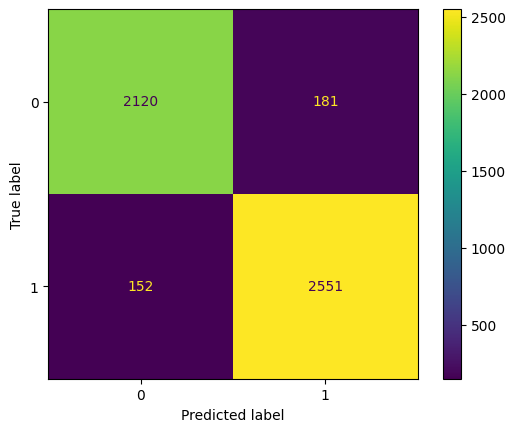

In [214]:
grid_bag_pred = grid_bag.predict(X_test)
print(metrics.classification_report(y_test,grid_bag_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_bag,X_test,y_test)

### For Light Gradient Boosting Model

In [215]:
base_lgbm = LGBMClassifier(class_weight='balanced',random_state=101)

In [216]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
              'learning_rate': np.linspace(0,1,6)[1:],
              'n_estimators': [200,500,600,1000],
              'importance_type': ['split','gain'],
              'min_split_gain': [0.68,0.79,0.87,1]}

In [217]:
grid_lgbm = RandomizedSearchCV(base_lgbm,param_grid,verbose=3)
grid_lgbm.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Info] Number of positive: 12232, number of negative: 10451
[CV 1/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=600;, score=nan total time=   0.2s
[LightGBM] [Info] Number of positive: 12233, number of negative: 10450
[CV 2/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=600;, score=nan total time=   0.0s
[LightGBM] [Info] Number of positive: 12233, number of negative: 10450
[CV 3/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=600;, score=nan total time=   0.0s
[LightGBM] [Info] Number of positive: 12233, number of negative: 10450
[CV 4/5] END boosting_type=rf, importance_type=gain, learning_rate=0.8, min_split_gain=1, n_estimators=600;, score=nan total time=   0.0s
[LightGBM] [Info] Number of positive: 12233, number of negative: 10451
[CV 5/5] END boosting_type=rf, i

RandomizedSearchCV(estimator=LGBMClassifier(class_weight='balanced',
                                            random_state=101),
                   param_distributions={'boosting_type': ['gbdt', 'dart',
                                                          'goss', 'rf'],
                                        'importance_type': ['split', 'gain'],
                                        'learning_rate': array([0.2, 0.4, 0.6, 0.8, 1. ]),
                                        'min_split_gain': [0.68, 0.79, 0.87, 1],
                                        'n_estimators': [200, 500, 600, 1000]},
                   verbose=3)

In [218]:
grid_lgbm.best_estimator_.get_params()

{'boosting_type': 'dart',
 'class_weight': 'balanced',
 'colsample_bytree': 1.0,
 'importance_type': 'gain',
 'learning_rate': 0.2,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 1,
 'n_estimators': 1000,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': 101,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      2301
           1       0.95      0.93      0.94      2703

    accuracy                           0.94      5004
   macro avg       0.93      0.94      0.93      5004
weighted avg       0.94      0.94      0.94      5004



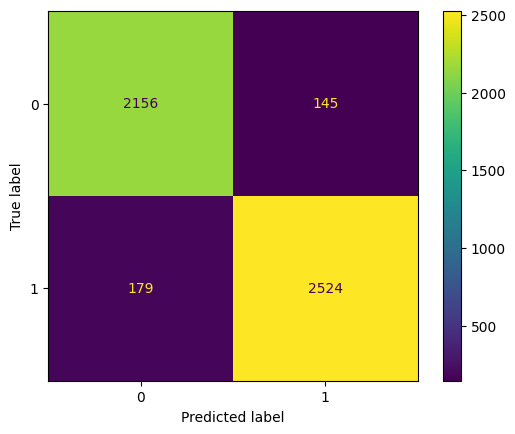

In [219]:
grid_lgbm_pred = grid_lgbm.predict(X_test)
print(metrics.classification_report(y_test,grid_lgbm_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_lgbm,X_test,y_test)

### For Extra Trees Classifier

In [220]:
base_et = ExtraTreesClassifier(random_state=101,verbose=2,oob_score=True)

In [221]:
param_grid = {'n_estimators': [100,300,600,1000],
             'criterion': ['gini','entropy'],
             'max_features': ['sqrt','log2'],
             'bootstrap': [True,False],
             'class_weight': ['balanced','balanced_subsample'],
             'warm_start': [True,False],
             'max_samples': [0.2,0.45,0.7,0.95]
             }

In [222]:
grid_et = RandomizedSearchCV(base_et,param_grid,verbose=4)
grid_et.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=True;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=True;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=True;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=True;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=True;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   40.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.3s finished


[CV 1/5] END bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=False;, score=0.925 total time=  49.7s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   38.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 2/5] END bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=False;, score=0.925 total time=  46.8s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   37.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 3/5] END bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=False;, score=0.923 total time=  46.2s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   37.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 4/5] END bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=False;, score=0.920 total time=  46.2s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   38.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.1s finished


[CV 5/5] END bootstrap=True, class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=False;, score=0.922 total time=  46.9s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   31.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.2s finished


[CV 1/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=True;, score=0.925 total time=  40.9s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   30.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.2s finished


[CV 2/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=True;, score=0.926 total time=  39.6s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   30.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.1s finished


[CV 3/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=True;, score=0.925 total time=  39.8s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   33.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 4/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=True;, score=0.919 total time=  42.2s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   31.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.2s finished


[CV 5/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=1000, warm_start=True;, score=0.923 total time=  40.3s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   22.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.3s finished


[CV 1/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.95, n_estimators=600, warm_start=False;, score=0.928 total time=  28.1s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   20.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.3s finished


[CV 2/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.95, n_estimators=600, warm_start=False;, score=0.928 total time=  25.9s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   19.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.1s finished


[CV 3/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.95, n_estimators=600, warm_start=False;, score=0.925 total time=  24.1s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   18.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.3s finished


[CV 4/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.95, n_estimators=600, warm_start=False;, score=0.920 total time=  24.2s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   19.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV 5/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.95, n_estimators=600, warm_start=False;, score=0.923 total time=  24.5s
building tree 1 of 300


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
building tree 43 of 300


[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    8.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 1/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=300, warm_start=False;, score=0.923 total time=  11.5s
building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 2/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=300, warm_start=False;, score=0.926 total time=  14.0s
building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:   10.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 3/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=300, warm_start=False;, score=0.923 total time=  12.8s
building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 4/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=300, warm_start=False;, score=0.920 total time=  11.4s
building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.6s finished


[CV 5/5] END bootstrap=True, class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.95, n_estimators=300, warm_start=False;, score=0.923 total time=  12.8s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   17.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    1.8s finished


[CV 1/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, n_estimators=1000, warm_start=False;, score=0.918 total time=  30.3s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   16.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    1.9s finished


[CV 2/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, n_estimators=1000, warm_start=False;, score=0.914 total time=  28.5s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   16.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 3/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, n_estimators=1000, warm_start=False;, score=0.916 total time=  29.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   17.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 4/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, n_estimators=1000, warm_start=False;, score=0.910 total time=  29.6s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   16.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.0s finished


[CV 5/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, n_estimators=1000, warm_start=False;, score=0.914 total time=  29.5s
[CV 1/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.95, n_estimators=600, warm_start=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.95, n_estimators=600, warm_start=False;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.95, n_estimators=600, warm_start=False;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.95, n_estimators=600, warm_start=False;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced_subsample, criterion=e

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
b

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 1/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=100, warm_start=True;, score=0.919 total time=   4.3s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building 

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


[CV 2/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=100, warm_start=True;, score=0.915 total time=   4.2s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV 3/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=100, warm_start=True;, score=0.911 total time=   4.2s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building 

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


[CV 4/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=100, warm_start=True;, score=0.911 total time=   4.2s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


[CV 5/5] END bootstrap=True, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=100, warm_start=True;, score=0.910 total time=   4.2s
[CV 1/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=False;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=False;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=False;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.7, n_estimators=300, warm_start=False;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced_subsample, criterion=entropy

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:   24.6s finished


RandomizedSearchCV(estimator=ExtraTreesClassifier(oob_score=True,
                                                  random_state=101, verbose=2),
                   param_distributions={'bootstrap': [True, False],
                                        'class_weight': ['balanced',
                                                         'balanced_subsample'],
                                        'criterion': ['gini', 'entropy'],
                                        'max_features': ['sqrt', 'log2'],
                                        'max_samples': [0.2, 0.45, 0.7, 0.95],
                                        'n_estimators': [100, 300, 600, 1000],
                                        'warm_start': [True, False]},
                   verbose=4)

In [223]:
grid_et.best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': 0.95,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 600,
 'n_jobs': None,
 'oob_score': True,
 'random_state': 101,
 'verbose': 2,
 'warm_start': False}

In [224]:
grid_et.best_score_

0.9248429943239795

In [225]:
grid_et.best_estimator_.oob_score_

0.9244198349439232

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


              precision    recall  f1-score   support

           0       0.93      0.90      0.91      2301
           1       0.91      0.95      0.93      2703

    accuracy                           0.92      5004
   macro avg       0.92      0.92      0.92      5004
weighted avg       0.92      0.92      0.92      5004



[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    1.1s finished


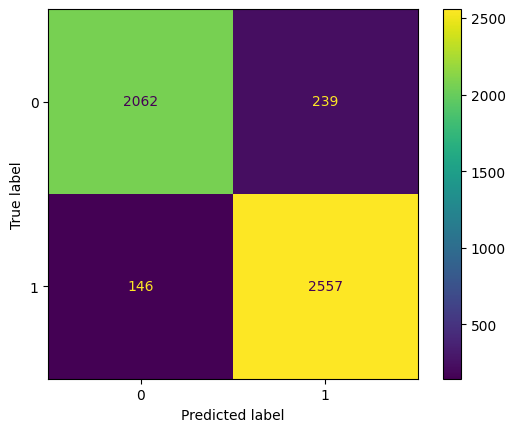

In [226]:
grid_et_pred = grid_et.predict(X_test)
print(metrics.classification_report(y_test,grid_et_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_et,X_test,y_test)

### For Extreme Gradient Boosting Classifier

In [227]:
base_xgb = XGBClassifier(random_state=101,verbosity=3,nthread=4)

In [232]:
param_grid = {'n_estimators': np.linspace(200,1000,5, dtype=int),
              'learning_rate': np.linspace(0.1,1,6),
              'booster': ['gbtree','dart'],
              'gamma': np.linspace(0.001,0.1,5),
              'importance_type': ['gain','weight','cover','total_gain','total_cover']
             }

In [233]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28354 entries, 17763 to 17931
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   age                           28354 non-null  float64
 1   gender                        28354 non-null  float64
 2   region_category               28354 non-null  float64
 3   membership_category           28354 non-null  float64
 4   joined_through_referral       28354 non-null  float64
 5   preferred_offer_types         28354 non-null  float64
 6   medium_of_operation           28354 non-null  float64
 7   internet_option               28354 non-null  float64
 8   days_since_last_login         28354 non-null  float64
 9   avg_time_spent                28354 non-null  float64
 10  avg_transaction_value         28354 non-null  float64
 11  avg_frequency_login_days      28354 non-null  float64
 12  points_in_wallet              28354 non-null  float64
 13  us

In [234]:
y_train.info()

<class 'pandas.core.series.Series'>
Index: 28354 entries, 19723 to 19911
Series name: churn_risk_score
Non-Null Count  Dtype
--------------  -----
28354 non-null  int64
dtypes: int64(1)
memory usage: 443.0 KB


In [ ]:
grid_xgb = GridSearchCV(base_xgb,param_grid,verbose=4)
grid_xgb.fit(X_train,y_train)

[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1,

[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] E

[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.

[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_ty

[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_ty

[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=tot

[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importa

[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importa

[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.025750000000000002, importance_

[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.45999999999999996, 

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importanc

[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505

[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_t

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, impor

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance

[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] E

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/

[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.0505, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/

[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.1, n_estimators=1000.0;,

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END boost

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, 

[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, 

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.82

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=4

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimato

[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=tota

[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=t

[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=tota

[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan

[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.07525000000000001, importance_typ

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.1, n_

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=

[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=gain, learning_rate=1.0,

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estim

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=wei

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=cover, learni

[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=cover, learni

[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, i

[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma

[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=

[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learnin

[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree,

[CV 3/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=

[CV 2/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=gain, learning_rate=

[CV 2/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=weight, le

[CV 2/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=weight

[CV 2/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=weight, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=cover, learn

[CV 2/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=8

[CV 2/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=cover, learning_rate

[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamm

[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_gain, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0

[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, 

[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.001, importance_type=total_cover, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, 

[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.1, n_estimators=400.0;, score=n

[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart,

[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=gain, learning_rate=1.0, n_estimators=600.0;, score=n

[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.459999

[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=weight, learning_rate=0.82, n_est

[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.1, n_estimators=800.0;, 

[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=0.64, n_estimators=4

[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=cover, learning_rate=1.0, n_estimators=1000.

[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0257500000000

[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_gain,

[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover

[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total

[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.025750000000000002, importance_type=total_cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.025750000000000002, importance_type=total

[CV 3/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=gain, learni

[CV 3/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=gain, le

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=weigh

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=0.64, n_estimators=200.0;, score=nan total time

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=weight, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=weigh

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.45999999999999996, n_estim

[CV 1/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=cover, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=cov

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, 

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=da

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.1, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, 

[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=0.64, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster

[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.0505, importance_type=total_cover, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=da

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0

[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=0.82, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=gain, learning_rate=1.0, n_estimators=200.0;, score=na

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.28, n_estimators=8

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=weight, learning_rate=0.64, n_estimato

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.1, n_estimators=600.0;, score=n

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, g

[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=cover, learning_rate=1.0, n_estimators=400.0;, score=n

[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, lea

[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=0.82, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, l

[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_gain, learning_rate=1.0, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learn

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=400.0;, score=nan total time=

[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.07525000000000001, importance_type=total_cover,

[CV 4/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.1, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.28, n_estimato

[CV 4/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=gain, learning_rate=0.64, n_estimato

[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.1, n_

[CV 3/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=0.45999999999999996, n_estimators=1000.

[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=weight, learning_rate=1.0, n_

[CV 4/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.28, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.45999999999999996, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/

[CV 4/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=cover, learning_rate=0.82, n_

[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.28, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance

[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=800.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_gain, learning_rate=0.64, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, impor

[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.1, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance

[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.45999999999999996, n_estimators=1000.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=0.64, n_estimators=200.0;, score=nan total time=   0.0s
[CV 1/5] 

[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=400.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 3/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 4/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 5/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=600.0;, score=nan total time=   0.0s
[CV 1/5] END booster=dart, gamma=0.1, importance_type=total_cover, learning_rate=1.0, n_estimators=800.0;, score=nan total time=   0.0s
[CV 2/5] END booster=dart, gamma=0.1, importance

TypeError: 'numpy.float64' object cannot be interpreted as an integer

In [ ]:
grid_xgb.best_estimator_.get_params()

### For Bernoulli Naive Bayes

In [ ]:
base_bnb = BernoulliNB()

In [ ]:
param_grid = {'alpha': np.linspace(0,1,6),
              'binarize': np.linspace(0,1,5),
              'fit_prior': [True,False]
             }

In [ ]:
grid_bnb = GridSearchCV(base_bnb,param_grid,verbose=3,cv=RepeatedKFold(n_splits=5,n_repeats=2))
grid_bnb.fit(X_train,y_train)

In [ ]:
grid_bnb.best_estimator_.get_params()

In [ ]:
grid_bnb.best_score_

In [ ]:
grid_bnb_pred = grid_bnb.predict(X_test)
print(metrics.classification_report(y_test,grid_bnb_pred))
metrics.ConfusionMatrixDisplay.from_estimator(grid_bnb,X_test,y_test)
plot_roc_curve(grid_bnb,X_test,y_test)
plot_precision_recall_curve(grid_bnb,X_test,y_test)

## Model Performance Analysis

In [ ]:
print("Accuracy Score of Logistic Regression:",str(np.round(accuracy_score(y_test,grid_lr_pred)*100,2)) + '%')
print("Accuracy Score of Ridge Classifier:",str(np.round(accuracy_score(y_test,ridge_pred)*100,2)) + '%')
print("Accuracy Score of Passive Aggressive Classifier:",str(np.round(accuracy_score(y_test,pac_pred)*100,2)) + '%')
print("Accuracy Score of Stochastic Gradient Descent Classifier:",str(np.round(accuracy_score(y_test,sgd_pred)*100,2)) + '%')
print("Accuracy Score of K Nearest Neighbors Classifier:",str(np.round(accuracy_score(y_test,grid_knn_pred)*100,2)) + '%')
print("Accuracy Score of Support Vector Machines Classifier:",str(np.round(accuracy_score(y_test,grid_svc_pred)*100,2)) + '%')
print("Accuracy Score of Gaussian Naive Bayes:",str(np.round(accuracy_score(y_test,gnb_pred)*100,2)) + '%')
print("Accuracy Score of Bernoulli Naive Bayes:",str(np.round(accuracy_score(y_test,grid_bnb_pred)*100,2)) + '%')
print("Accuracy Score of Decision Tree Classifier:",str(np.round(accuracy_score(y_test,dtree_pred)*100,2)) + '%')
print("Accuracy Score of Random Forest Classifier:",str(np.round(accuracy_score(y_test,grid_rfc_pred)*100,2)) + '%')
print("Accuracy Score of Extreme Gradient Boosting Classifier:",str(np.round(accuracy_score(y_test,xgb_pred)*100,2)) + '%')
print("Accuracy Score of Categorical Boosting Classifier:",str(np.round(accuracy_score(y_test,grid_cat_pred)*100,2)) + '%')
print("Accuracy Score of Adaptive Boosting Classifier:",str(np.round(accuracy_score(y_test,grid_ada_pred)*100,2)) + '%')
print("Accuracy Score of Gradient Boosting Classifier:",str(np.round(accuracy_score(y_test,gbc_pred)*100,2)) + '%')
print("Accuracy Score of Light Gradient Boosting Model:",str(np.round(accuracy_score(y_test,grid_lgbm_pred)*100,2)) + '%')
print("Accuracy Score of Extra Trees Classifier:",str(np.round(accuracy_score(y_test,et_pred)*100,2)) + '%')
print("Accuracy Score of Bagging Classifier:",str(np.round(accuracy_score(y_test,grid_bag_pred)*100,2)) + '%')
print("Accuracy Score of Histogram-based Gradient Boosting Classifier:",str(np.round(accuracy_score(y_test,grid_hgbc_pred)*100,2)) + '%')
print("Accuracy Score of Voting Classifier:",str(np.round(accuracy_score(y_test,vc_pred)*100,2)) + '%')

### As is clearly evident from the above results, Voting Classifier provides the best fit for data and possesses an excellent prediction accuracy of more than 93.5%.  

## Saving the model for future use

In [ ]:
joblib.dump(grid_bag,'model.pkl')

In [ ]:
model = joblib.load('model.pkl')
model

In [ ]:
joblib.dump(scaler,'scaler.bin')

In [ ]:
scaler = joblib.load('scaler.bin')
scaler